In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<center> <h1> <b> Signal Processing (EE2000) </b> </h1> </center>


<dt> <h4>
 <b> Programming Assignment (02) : Discrete-Time Systems (Unit sample response) </b> </h4> </dt>

<dt> <h4> Welcome to the second programming assignment (PA) on  Signal Processing (EE2000) course. The objective of this PA is to develop discrete-time systems, verify their properties and study their frequency domain characteristics. The major objectives of this PA are as follows:: </h4> </dt>

<dd> <h4> 1. Developing discrete-time systems for specified tasks. </dd> </h4>

<dd> <h4> 2. Verifying linearity and time-invariant properties of an arbitrary discrete-time system. </dd> </h4>

<dd> <h4> 3. Verifying the operations of discrete time LTI systems on natural signals.</dd> </h4>



<dt> <h4> <b> Instructions </b> </dt> </h4>

<dd> <h4> 1. Plagiarism is strictly prohibited. </h4> </dd>
<dd> <h4> 2. Delayed submissions will be penalized with a scaling factor of 0.5 per each hour. </h4> </dd>
<dd> <h4> 3. Deadline will not be be extended under any circumstances </h4> </dd>


[link to audio, speech and digital images required for this PA](https://drive.google.com/drive/folders/13t992Z3WxDD7zDajp5FTrA_9o8rOoZoD?usp=sharing)


<h4> <b> Part (1) : Implementation of discrete-time systems : </b>  

<h4> <b> Objective : </b>  

<dt> <h4> The concept of system is very common in engineering. A physical system may be defined as a physical device that performs a specific operation on an input signal. Most of the physical systems are inertial in nature, in the sense that they produce an output or response only when they are subjected to an external input or excitation. In consistent with this definition of the
system, a digital system is one that accepts a digital signal as input, and generates another digital signal as its output. </h4> </dt>

<dt> <h4> For our purposes, it is convenient to broaden the definition of a system to include not only physical devices, but also software realizations of operations on a signal. In digital processing of signals on a digital computer, the operations performed on a signal consist of a series of mathematical operations as specified by a software program. In this case, the program represents an implementation of the system in software. Thus we have a system that is realized on a digital computer by means of a sequence of mathematical operations; that is we have digital signal processing realized in software. For example, a digital computer can be programmed to reduce noise and interference in the input signal. Alternatively, the digital processing on the signal may be performed by digital hardware (logic circuits) configured to perform the desired
operations.</h4> </dt>


<h4> <b> Programming Questions : </b>  


<dt> <h4> a. Simulate a time-reversal system in python, that takes an arbitrary input x[n], and outputs it time-reversed version. y[n] = x[−n] </h4> </dt>


<dt> <h4> b. Simulate a discrete-time system in python, that takes an arbitrary signal x[n] as input and generates its even component at the output. $y[n] = x_{e}[n]$. Use the system developed in part (a) to realize this. </h4> </dt>

<dt> <h4> c. Simulate a discrete-time system in python, that takes an arbitrary signal x[n] as input and generates its odd component at the output. $y[n] = x_{o}$[n]. Use the system developed in part (a) to realize this. </h4> </dt>

<dt> <h4> d. Simulate an ideal-delay system, that accepts an arbitrary input x[n] and outputs its time delayed version. y[n] = x[n − d], where d is an integer. </h4> </dt>

<dt> <h4> e. Simulate a moving average system described by the following input-output relation:  </h4> </dt>
<dt> <h4> <center> $y[n] = \frac{1}{M+1} \sum_{k=0}^{M} x[n-k]$ </center> </h4> </dt>
<dd> <h4>  Use the ideal delay system developed in part (e) to realize this. </dd> </h4>

<dt> <h4> f. Simulate a backward difference system described by the following input-output relation  </h4> </dt>
<dt> <h4> <center> $y[n] = x[n] - x[n-1]$ </center> </h4> </dt>

<dt> <h4> g. Simulate a discrete-time system with input-output relation: </h4> </dt>
<dt> <h4> <center> $y[n] = x[n] - 2x[n-1] + x[n-2]$ </center> </h4> </dt>


<dt> <h4> h. Simulate a squarer system with input-output relation $y[n] = x^{2}[n]$ </h4> </dt>

<dt> <h4> i. Simulate a discrete-time system whose input and output are related by $y[n] = x[n-2] + x[2-n]$  </h4> </dt>

<dt> <h4> ------------ </h4> </dt>

<dt> <h4>
Verify the operation of all the above systems for input $x[n] = 0.95^n u[n]$ . Use M=10 for the moving average system. Plot the input and output of all the systems. </h4> </dt>



In [ ]:
#All imports
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

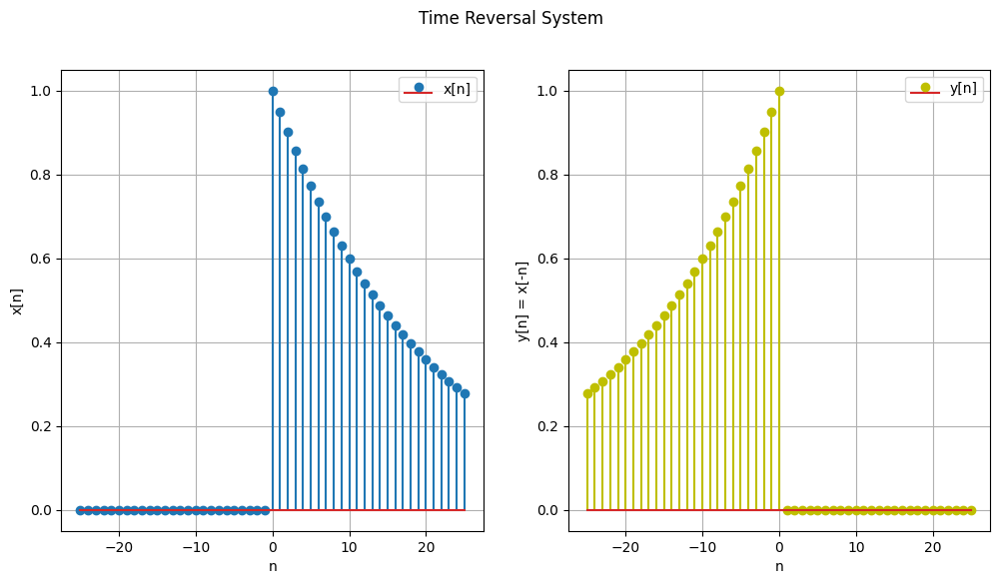

In [ ]:
###############################################
#(a)
################################################
import numpy as np
import matplotlib.pyplot as plt

def time_reversal(x,n):
  N = len(x)
  y = np.zeros(N)
  n_new = np.zeros(N)

  for i in range(N):
    y[i] = x[N - i - 1] #reverse array
    n_new[i] = -n[N - i - 1] #reverse time array and negate

  return y, n_new

n = np.arange(-25, 26)
x = (0.95**n) * np.where(n >= 0, 1, 0)

y,n_new = time_reversal(x,n)

plt.figure(figsize=(12,6))
plt.suptitle("Time Reversal System")

plt.subplot(1,2,1)
plt.stem(n,x,label='x[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x[n]")
plt.legend()

plt.subplot(1,2,2)
plt.stem(n_new,y,label='y[n]', linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = x[-n]")
plt.legend()
plt.show()

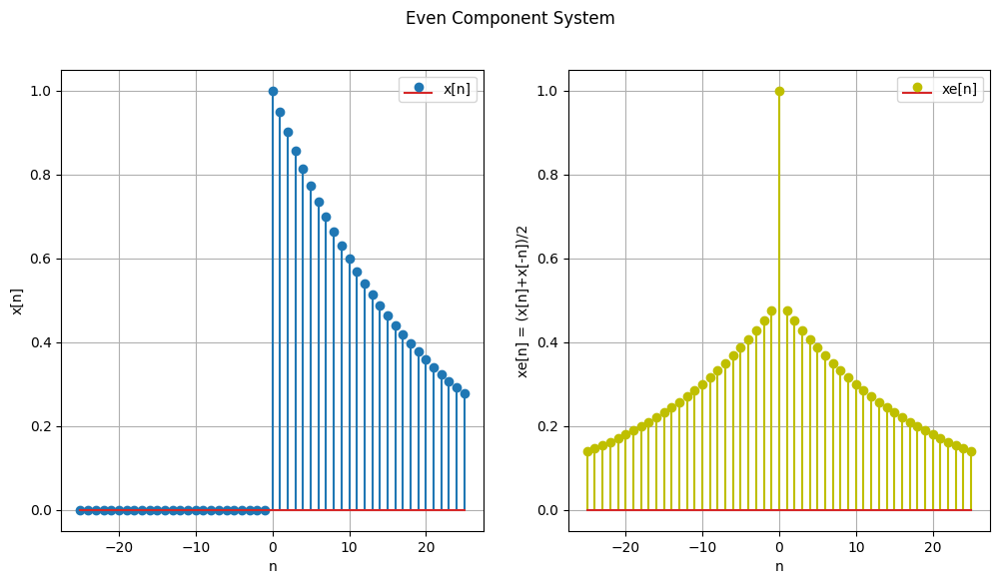

In [ ]:
###############################################
#(b)
################################################
#xe[n] = (x[n] + x[-n])/2
import numpy as np
import matplotlib.pyplot as plt

def even_component(x,n):
  y, n_new = time_reversal(x,n)
  n_min = min(min(n), min(n_new))
  n_max = max(max(n), max(n_new))
  N = np.arange(n_min, n_max+1) #even component index

  X = np.zeros(len(N))
  Y = np.zeros(len(N))
  #check indexes and update X
  for i in range(len(n)):
    for j in range(len(N)):
      if n[i] == N[j]:
        X[j] = x[i]

  #check indexes and update Y
  for i in range(len(n_new)):
    for j in range(len(N)):
      if n_new[i] == N[j]:
        Y[j] = y[i]

  xe = (X + Y)/2
  return xe, N

n = np.arange(-25, 26)
x = (0.95**n) * np.where(n >= 0, 1, 0)

xe, N = even_component(x,n)

plt.figure(figsize=(12,6))
plt.suptitle("Even Component System")

plt.subplot(1,2,1)
plt.stem(n,x,label='x[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x[n]")
plt.legend()

plt.subplot(1,2,2)
plt.stem(N,xe,label='xe[n]', linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("xe[n] = (x[n]+x[-n])/2")
plt.legend()
plt.show()



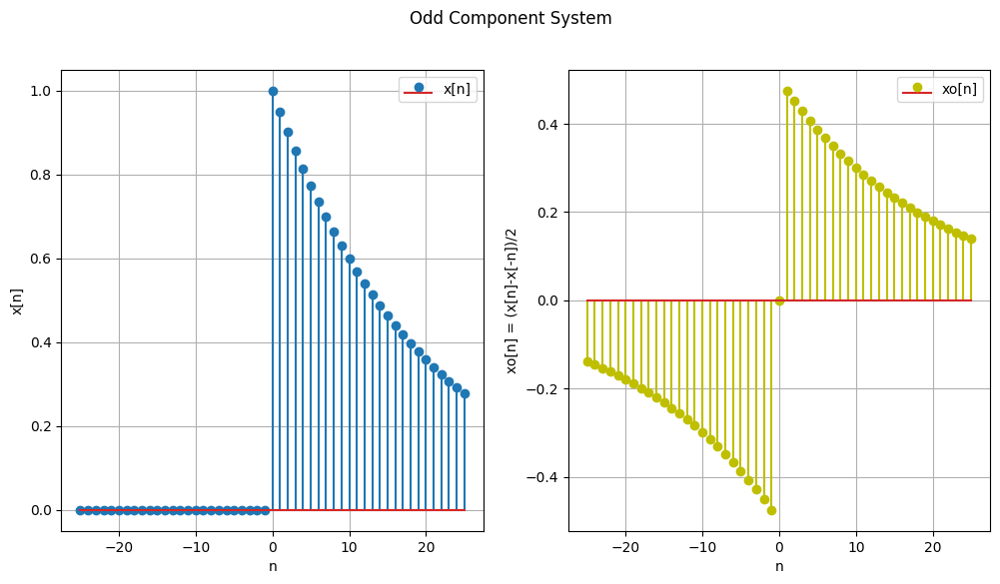

In [ ]:
###############################################
#(c)
################################################
#xo[n] = (x[n] - x[-n])/2
import numpy as np
import matplotlib.pyplot as plt

def odd_component(x,n):
  y, n_new = time_reversal(x,n)
  n_min = min(min(n), min(n_new))
  n_max = max(max(n), max(n_new))
  N = np.arange(n_min, n_max+1) #odd component index

  X = np.zeros(len(N))
  Y = np.zeros(len(N))

  #check indexes and update X
  for i in range(len(n)):
    for j in range(len(N)):
      if n[i] == N[j]:
        X[j] = x[i]

  #check indexes and update Y
  for i in range(len(n_new)):
    for j in range(len(N)):
      if n_new[i] == N[j]:
        Y[j] = y[i]

  xo = (X - Y)/2
  return xo, N

n = np.arange(-25, 26)
x = (0.95**n) * np.where(n >= 0, 1, 0)

xo, N = odd_component(x,n)

plt.figure(figsize=(12,6))
plt.suptitle("Odd Component System")

plt.subplot(1,2,1)
plt.stem(n,x,label='x[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x[n]")
plt.legend()

plt.subplot(1,2,2)
plt.stem(N,xo,label='xo[n]', linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("xo[n] = (x[n]-x[-n])/2")
plt.legend()
plt.show()


Enter delay value : 2


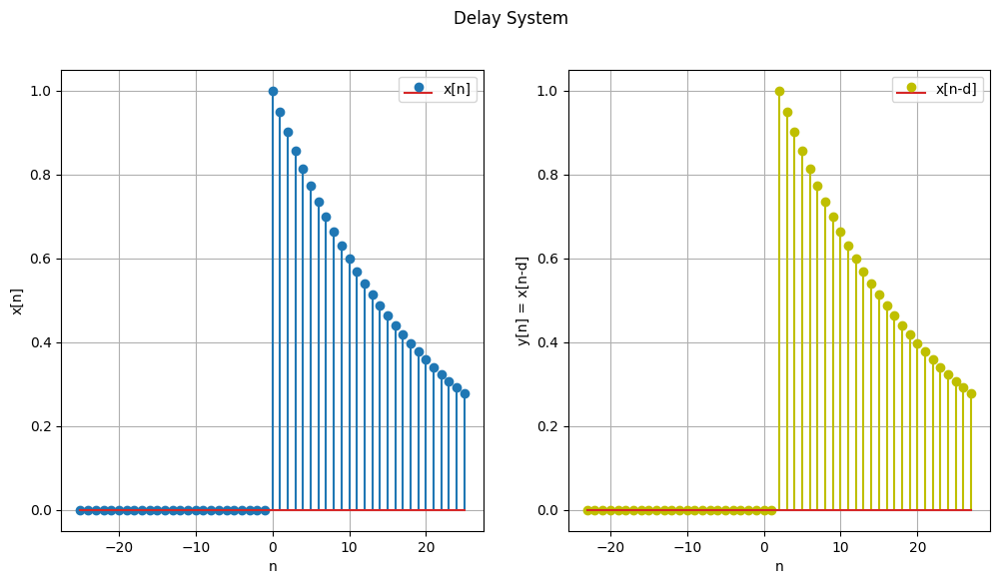

In [ ]:
###############################################
#(d)
################################################
#y[n] = x[n-d]
import numpy as np
import matplotlib.pyplot as plt

def delay(x,n,d):
  n_new = n + d
  y = x.copy()
  return y, n_new

n = np.arange(-25, 26)
x = (0.95**n) * np.where(n >= 0, 1, 0)

d = int(input("Enter delay value : "))

y,n_new = delay(x,n,d)

plt.figure(figsize=(12,6))
plt.suptitle("Delay System")

plt.subplot(1,2,1)
plt.stem(n,x,label='x[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x[n]")
plt.legend()

plt.subplot(1,2,2)
plt.stem(n_new,y,label='x[n-d]', linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = x[n-d]")
plt.legend()
plt.show()



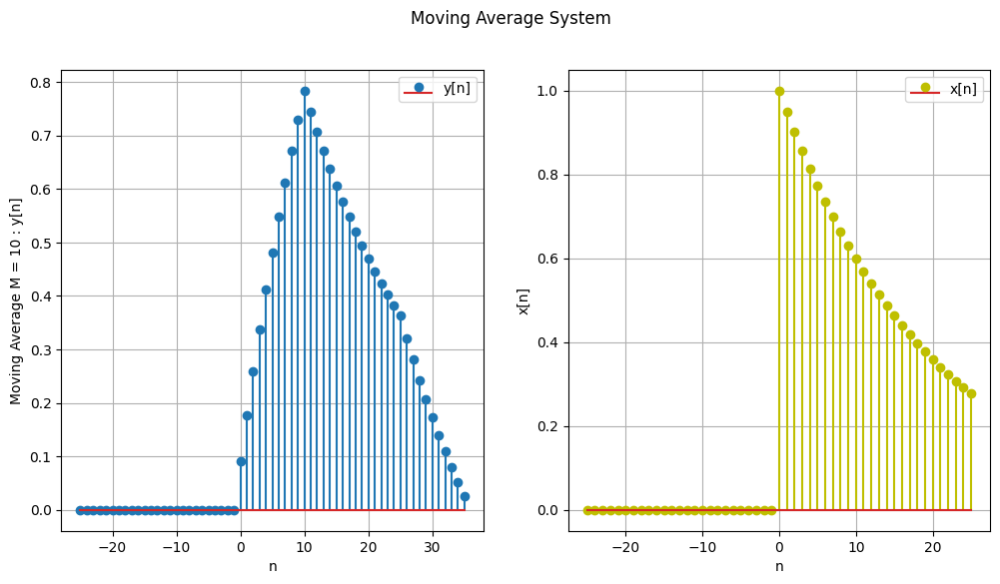

In [ ]:
###############################################
#(e)
################################################
#Moving average M = 10

n = np.arange(-25, 26)
x = (0.95**n) * np.where(n >= 0, 1, 0)

def moving_average(x,n,m):
  n_y = np.arange(n[0], n[-1] + m + 1)
  y = np.zeros(len(n_y))
  for i in range(m+1):
      xi, ni = delay(x, n, i)
      xi_new = np.zeros(len(n_y))
      xi_new[(ni - n_y[0]).astype(int)] = xi
      y = y + xi_new
  return y/(m+1), n_y

y, n_y = moving_average(x,n,10)

plt.figure(figsize=(12,6))
plt.suptitle("Moving Average System")
plt.subplot(1,2,1)
plt.stem(n_y, y, label='y[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("Moving Average M = 10 : y[n]")
plt.legend()

plt.subplot(1,2,2)
plt.stem(n, x, label='x[n]', linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x[n]")
plt.legend()
plt.show()



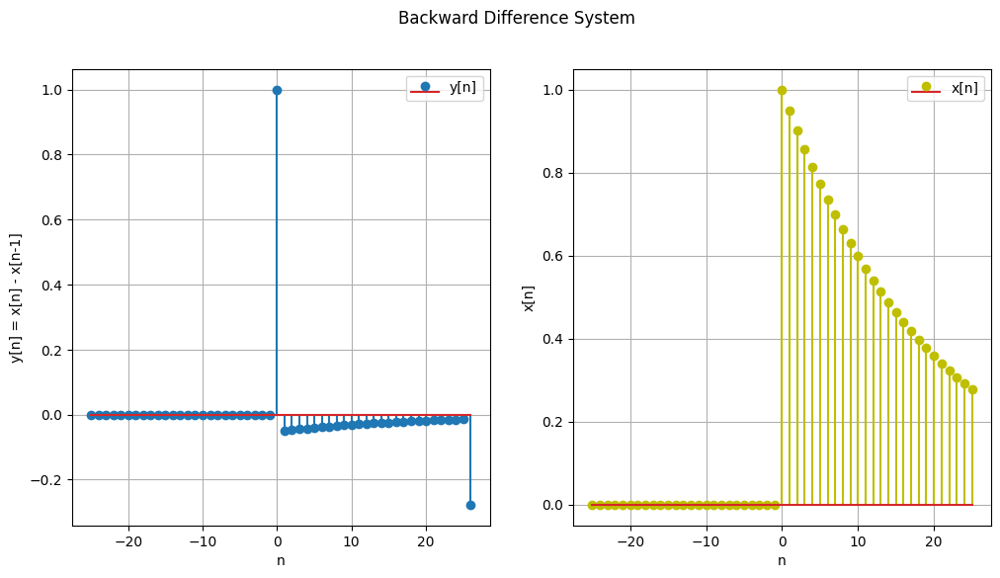

In [ ]:
###############################################
#(f)
################################################
#y[n] = x[n] - x[n-1]

n = np.arange(-25, 26)
x = (0.95**n) * np.where(n >= 0, 1, 0)
d = 1

def backward_diff(x,n):
  x1, n_new = delay(x,n,d)
  n_y = np.arange(min(n[0], n_new[0]), max(n[-1], n_new[-1]) + 1)

  x_new = np.zeros(len(n_y))
  x1_new = np.zeros(len(n_y))
  x_new[(n - n_y[0]).astype(int)]   = x
  x1_new[(n_new - n_y[0]).astype(int)] = x1

  y = x_new - x1_new
  return y, n_y

y, n_y = backward_diff(x,n)

plt.figure(figsize=(12,6))
plt.suptitle("Backward Difference System")
plt.subplot(1,2,1)
plt.stem(n_y, y, label='y[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = x[n] - x[n-1]")
plt.legend()

plt.subplot(1,2,2)
plt.stem(n, x, label='x[n]', linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x[n]")
plt.legend()
plt.show()


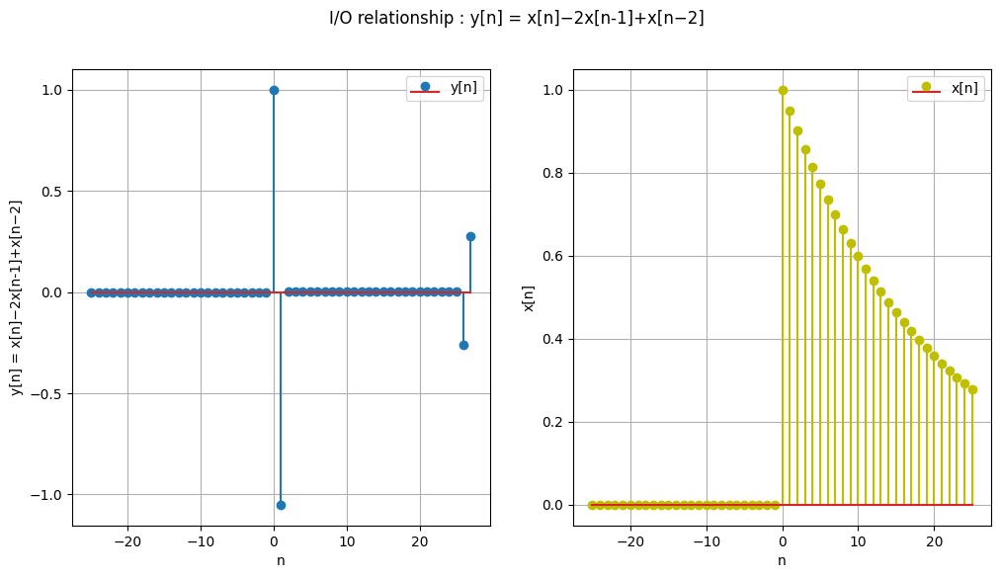

In [ ]:
###############################################
#(g)
################################################
#y[n]=x[n]−2x[n-1]+x[n−2]

n = np.arange(-25, 26)
x = (0.95**n) * np.where(n >= 0, 1, 0)

def second_order_difference(x,n):
  x1, n_new1 = delay(x,n,1)
  x2, n_new2 = delay(x,n,2)
  n_y = np.arange(min(n[0], n_new2[0]), max(n[-1], n_new2[-1]) + 1)

  x_new = np.zeros(len(n_y))
  x1_new = np.zeros(len(n_y))
  x2_new = np.zeros(len(n_y))

  x_new[(n - n_y[0]).astype(int)]   = x
  x1_new[(n_new1 - n_y[0]).astype(int)] = x1
  x2_new[(n_new2 - n_y[0]).astype(int)] = x2

  y = x_new - 2*x1_new + x2_new
  return y, n_y

y, n_y = second_order_difference(x,n)

plt.figure(figsize=(12,6))
plt.suptitle("I/O relationship : y[n] = x[n]−2x[n-1]+x[n−2]")
plt.subplot(1,2,1)
plt.stem(n_y, y, label='y[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = x[n]−2x[n-1]+x[n−2]")
plt.legend()

plt.subplot(1,2,2)
plt.stem(n, x, label='x[n]',linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x[n]")
plt.legend()
plt.show()



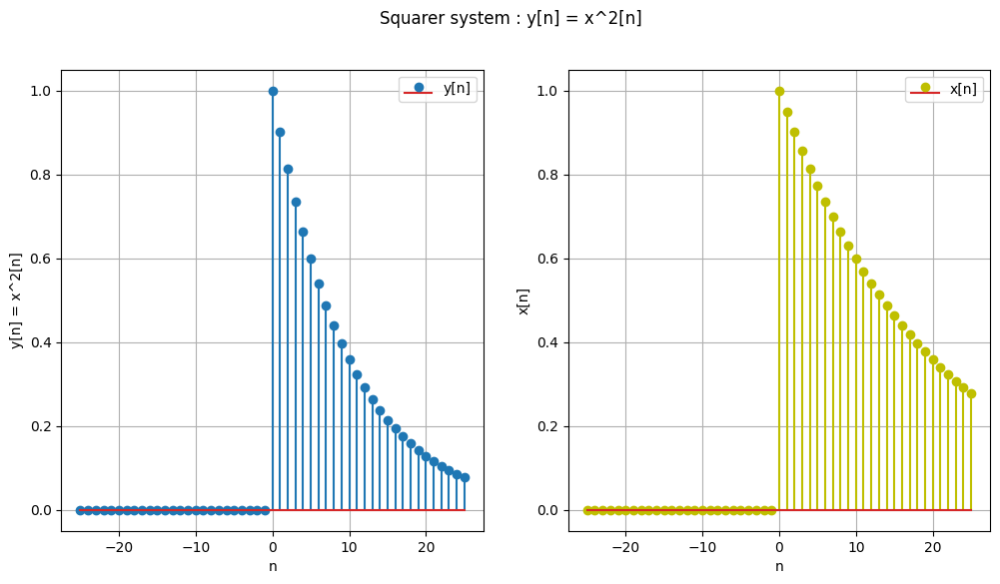

In [ ]:
###############################################
#(h)
################################################
#y[n] = x^2[n]

n = np.arange(-25, 26)
x = (0.95**n) * np.where(n >= 0, 1, 0)

y = x**2

plt.figure(figsize=(12,6))
plt.suptitle("Squarer system : y[n] = x^2[n]")
plt.subplot(1,2,1)
plt.stem(n,y, label='y[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = x^2[n]")
plt.legend()

plt.subplot(1,2,2)
plt.stem(n, x, label='x[n]',linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x[n]")
plt.legend()
plt.show()


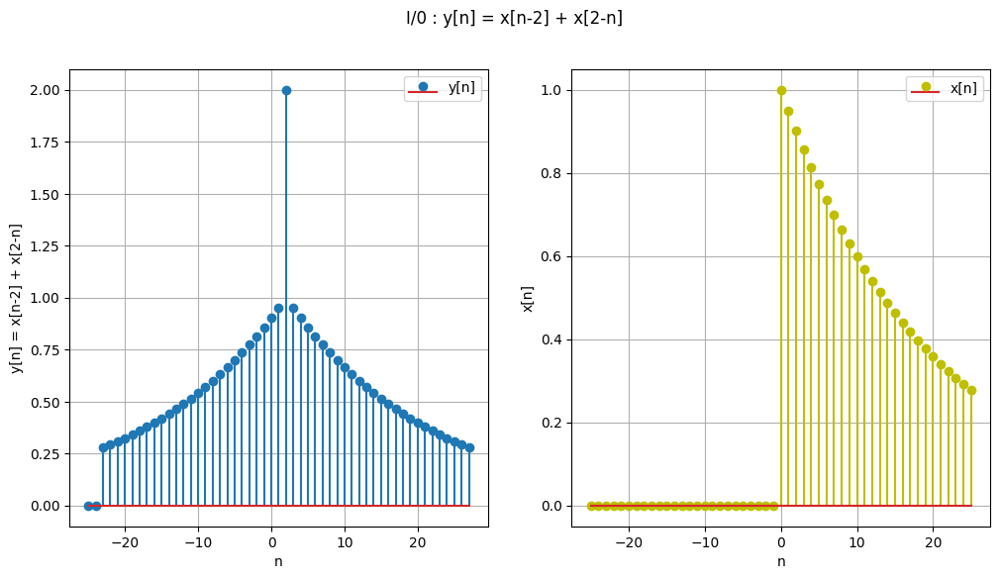

In [ ]:
###############################################
#(i)
################################################
#y[n] = x[n-2] + x[2-n]

n = np.arange(-25, 26)
x = (0.95**n) * np.where(n >= 0, 1, 0)

def symmetrix_2(x,n):
  x1, n_new1 = delay(x,n,2)
  x2, n_new2 = time_reversal(x,n)
  x2_1, n_new2_1 = delay(x2,n_new2,2)

  n_min = min(n[0], n_new1[0], n_new2_1[0])
  n_max = max(n[-1], n_new1[-1], n_new2_1[-1])
  n_y = np.arange(n_min, n_max+1)

  x_new   = np.zeros(len(n_y))
  x1_new  = np.zeros(len(n_y))
  x2_1_new = np.zeros(len(n_y))

  x_new[(n - n_y[0]).astype(int)] = x
  x1_new[(n_new1 - n_y[0]).astype(int)] = x1
  x2_1_new[(n_new2_1 - n_y[0]).astype(int)] = x2_1

  y = x1_new + x2_1_new
  return y, n_y

y, n_y = symmetrix_2(x,n)

plt.figure(figsize=(12,6))
plt.suptitle("I/0 : y[n] = x[n-2] + x[2-n]")
plt.subplot(1,2,1)
plt.stem(n_y, y, label='y[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = x[n-2] + x[2-n]")
plt.legend()

plt.subplot(1,2,2)
plt.stem(n, x, label='x[n]',linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x[n]")
plt.legend()
plt.show()

<h4> <b> Report your observations : </b>  
<dt> <h4> Input signal x[n] = 0.95^n u[n], is an exponentially decaying and a causal system
</h4> </dt>

<dt> <h4> i. The time reversed signal x[-n] is non negative for n<=0, the signal flips. After time reversal, the signal becomes non causal.
</h4> </dt>

<dt> <h4> ii. Any signal can be written as sum of it even and odd components
</h4> </dt>

<dt> <h4> iii. An ideal delay system just shifts the input signal by d with no distortion in shape or amplitude
 </h4> </dt>

 <dt> <h4> iv. In the moving average system the summation increases till n = 10, then decreases. It smoothens the signal. It preserves linearity and scaling.
</h4> </dt>

<dt> <h4> v. Backward Difference system implements discrete differentiation, highlights the difference between the present and its previous sample.
</h4> </dt>

<dt> <h4> vi. The squarer system just amplifies the input signal, the decay becomes faster.
</h4> </dt>

<dt> <h4> vii. The second order difference system y[n] = x[n] - 2x[n-1] + x[n-2] is equivalent to double derivative in continuous domian. It captures the curvature of the signal
</h4> </dt>

<dt> <h4> viii. y[n] = x[n-2] + x[2-n] is symmetric about n = 2
</h4> </dt>


<h4> <b> Part (2) : Linear Time-Invariant Systems : </b>
<h4> <b> Objective : </b>  

<dt> <h4> Linear time-invariant (LTI) systems form an important subset of general systems. Sophisticated mathematical tools are available to analyze the LTI systems. For example, convolution can be used to determine the output of an LTI system to an arbitrary input. In order to make use of the available mathematical tools, we need to determine whether a given system satisfies the
properties of linearity and time-invariance or not. The objective of this experiment is to verify the linearity and time-invariance properties of a given LTI system using a digital system. </h4> </dt>

<h4> <b> Programming Questions : </b>  

<dt> <h4> a. Generate the following test signals for −100 ≤ n ≤ 100.</h4> </dt>
<dt> <h4> <center> $x_{1}[n] = 0.9^{n}u[n]$ </center> </dt></h4>
<dt> <h4> <center> $x_{2}[n] = sin(2\pi \frac{200}{800} n)$ </center> </dt></h4>


<dt> <h4> b. <b> Linearity </b>: Apply $x_1[n]$, and $x_2[n]$ as inputs to the system and generate the outputs $y_1[n]$ and $y_2[n]$, respectively. Now apply $ax_1[n] + bx_2[n]$ as input to the system to generate the output y[n]. To verify linearity check whether y[n] is equal to $ay_1[n]+by_2[n]$ or not. Check
for linearity of all the systems simulated in part (a).   </h4> </dt>

<dt> <h4> c. <b> Time-Invariance </b>: Apply $x_1[n]$ as input to the system and generate the output $y_1[n]$. Now apply $x_1[n − d]$ as input and generate the output y[n]. To verify time-invariance property check whether y[n] is equal to $y_1[n − d]$ or not. Repeat verification for $x_2[n]$. Check for time-invariance of all the systems simulated in part (a).</h4> </dt>






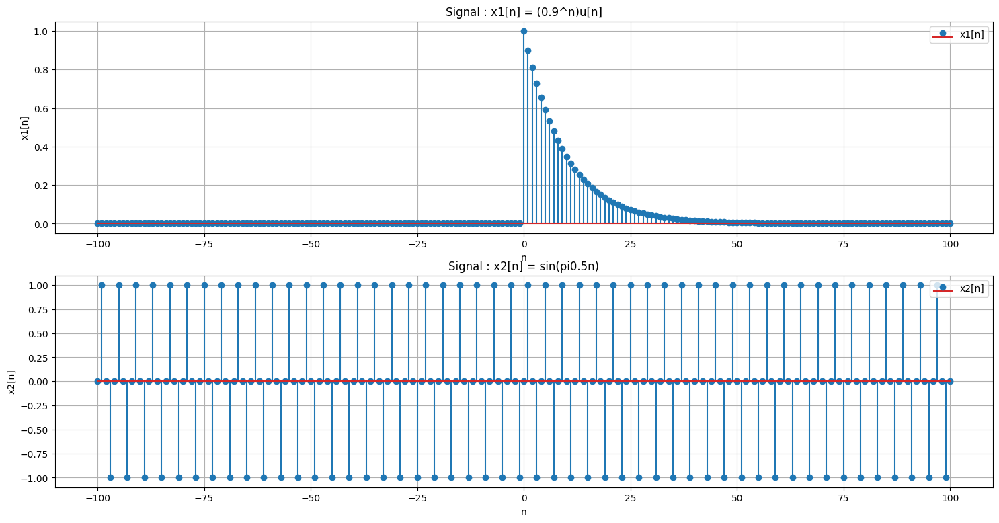

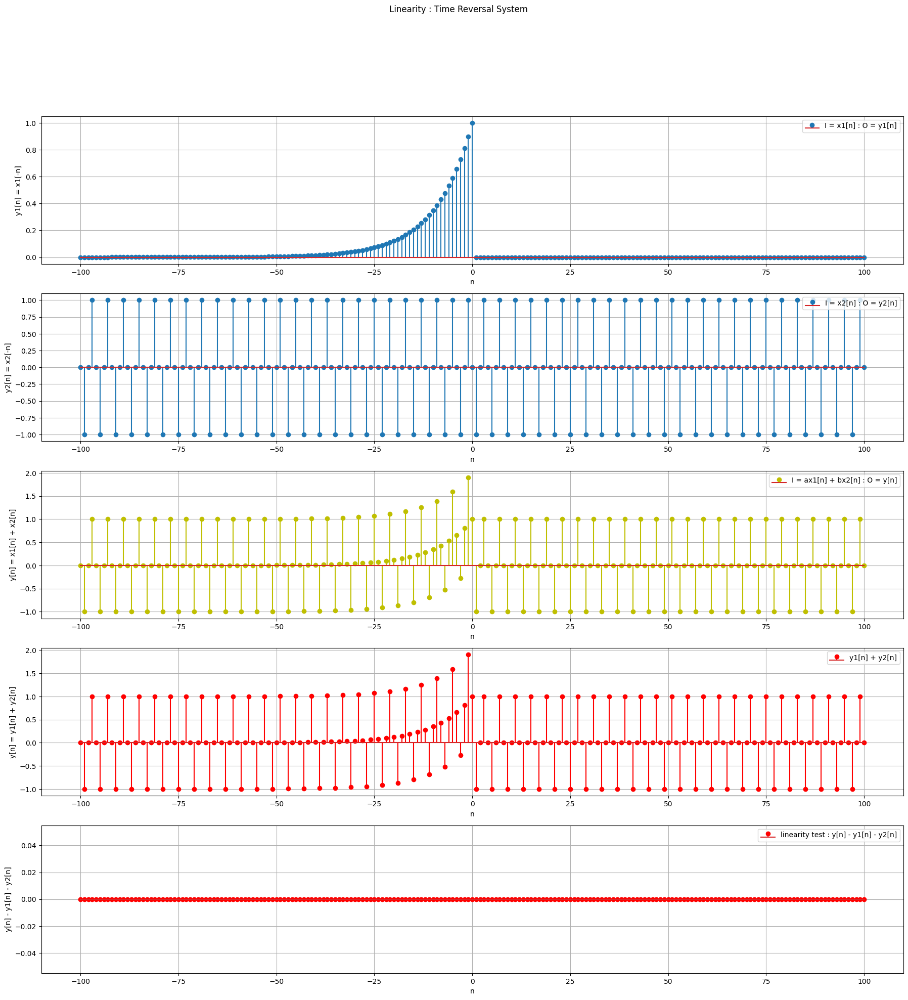

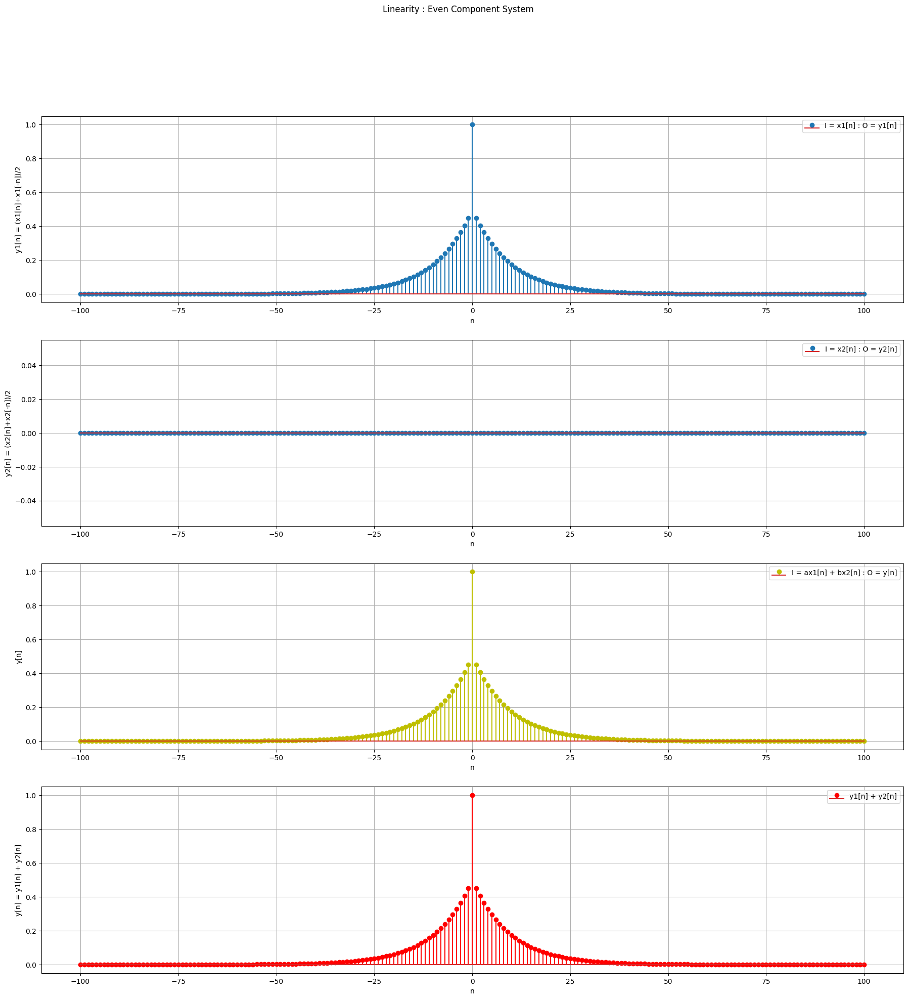

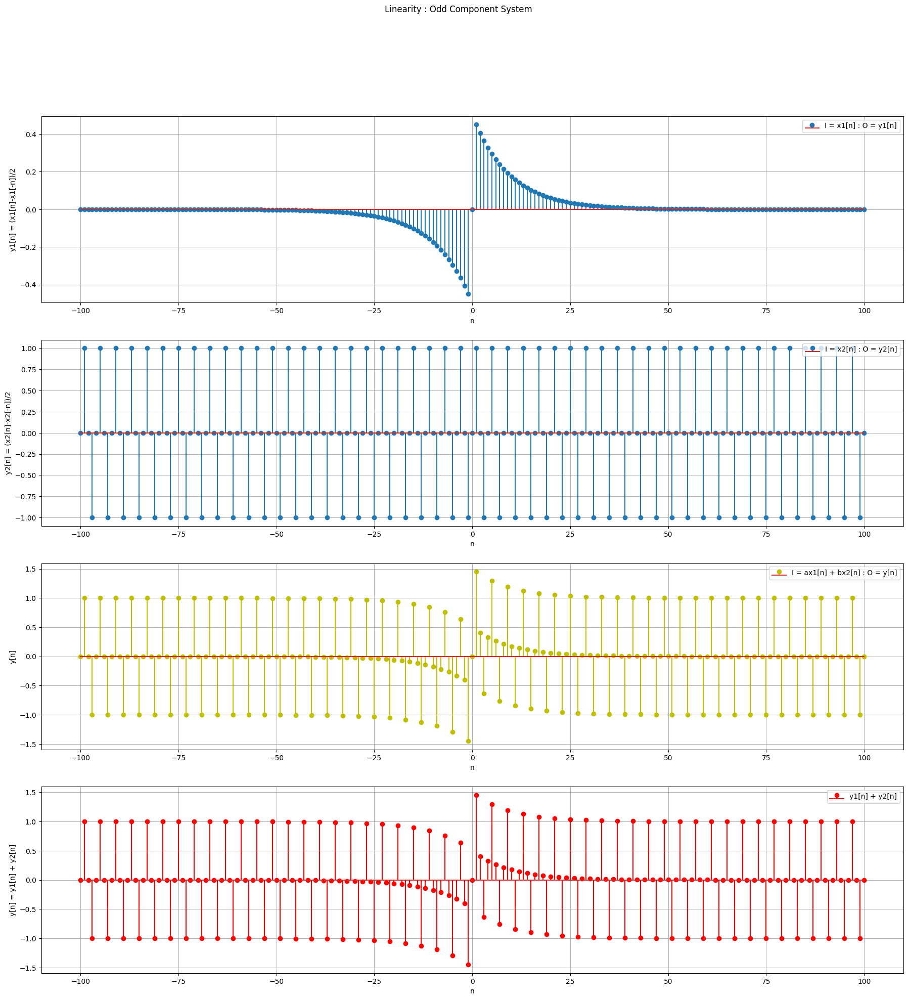

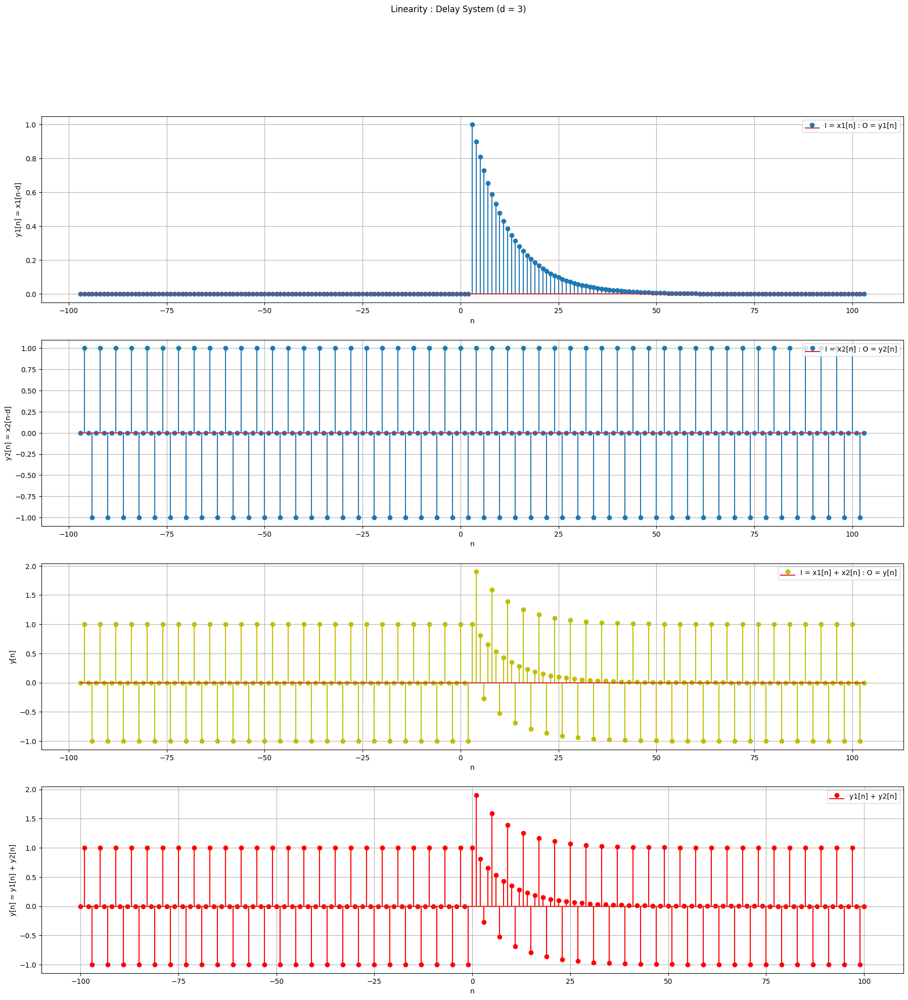

...

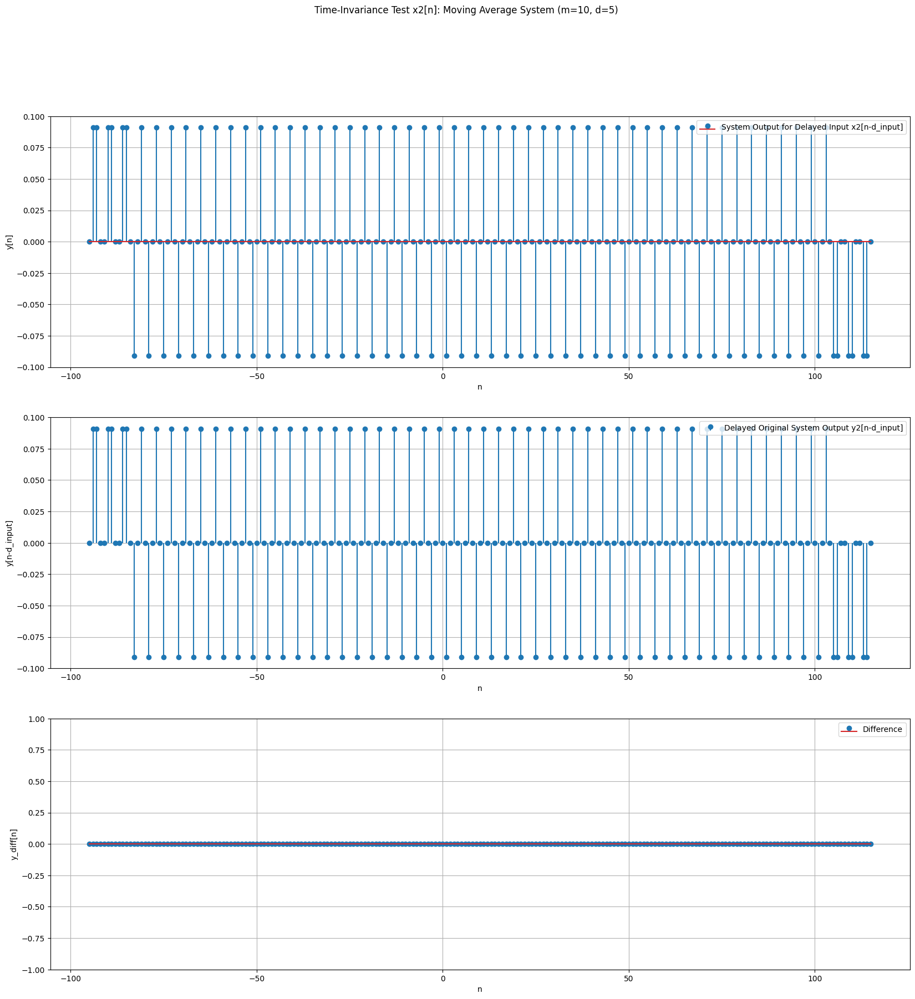

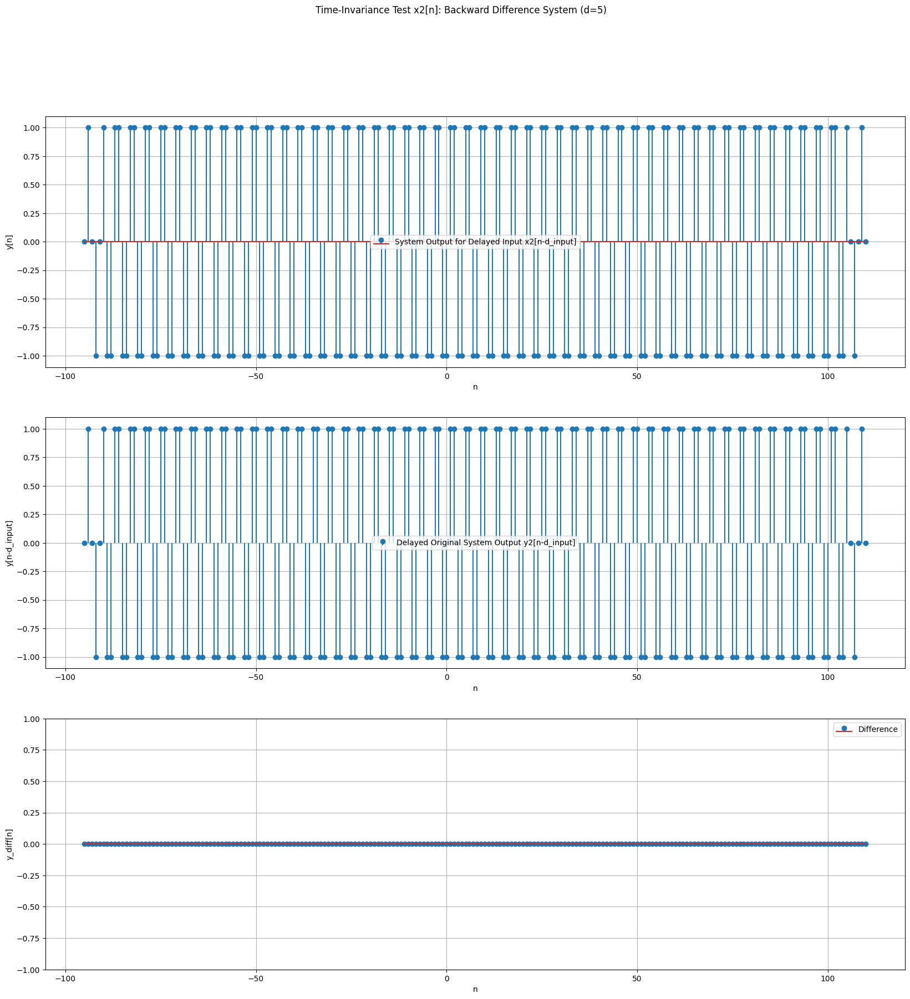

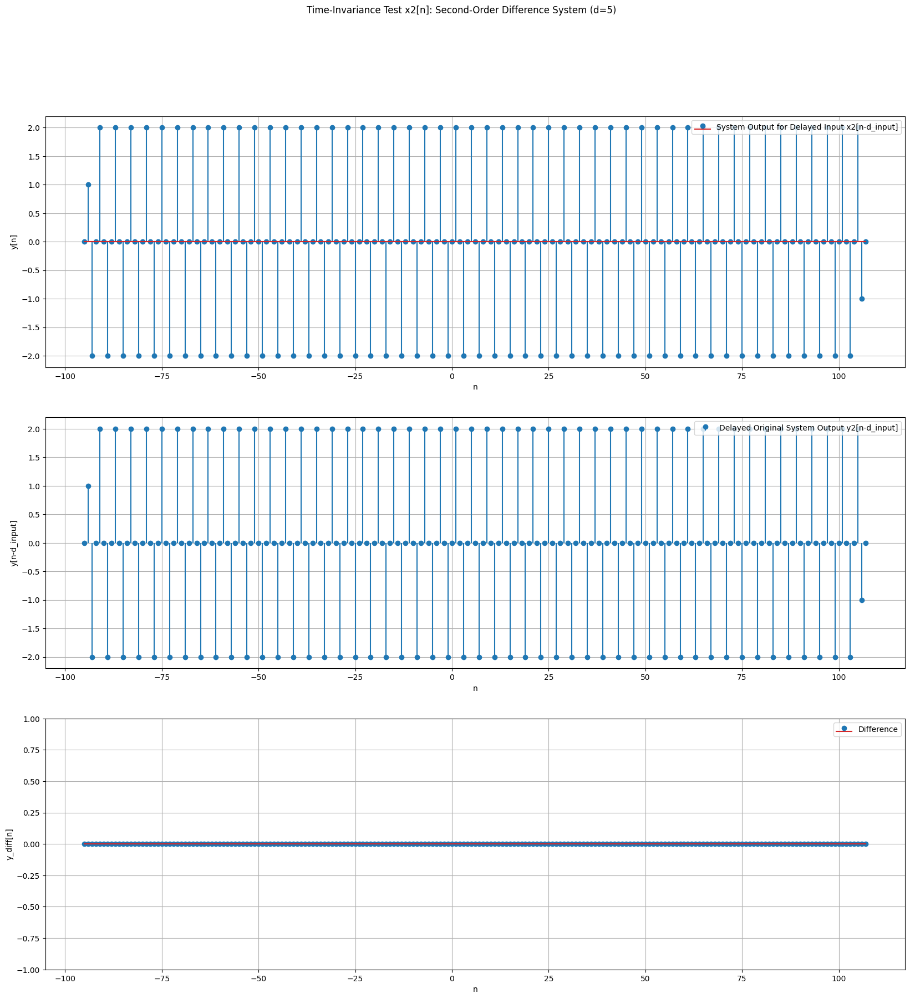

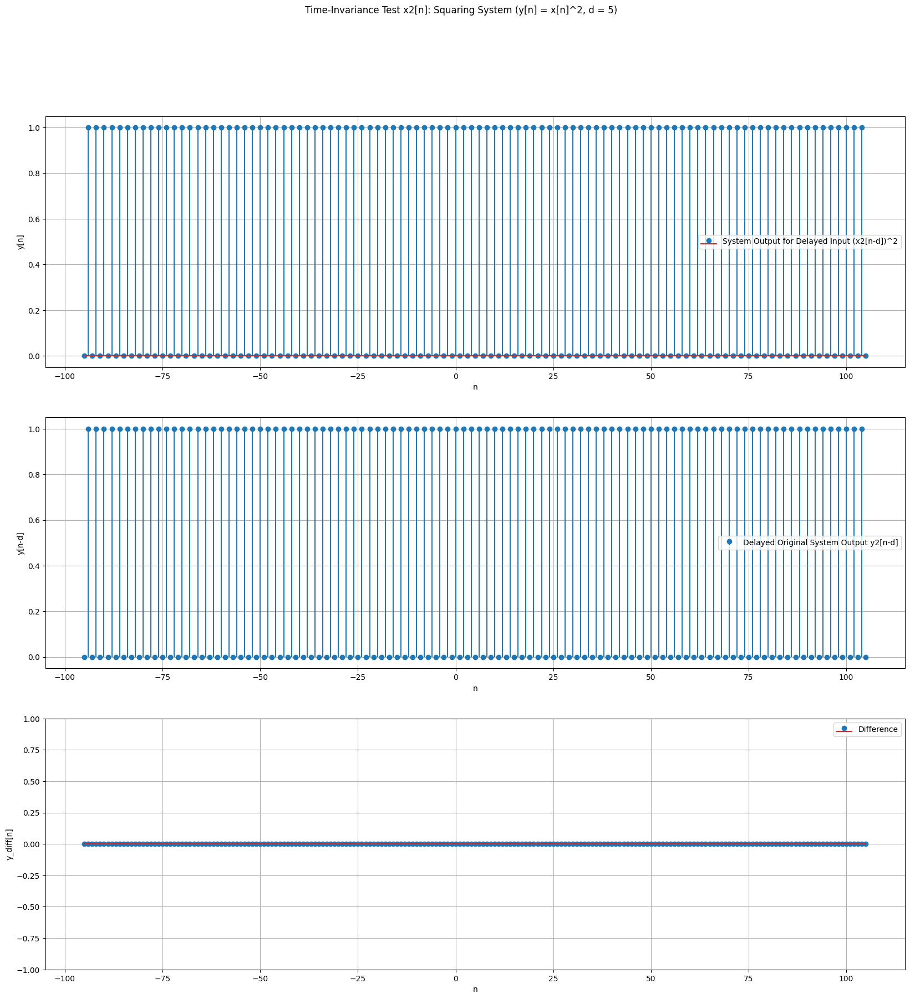

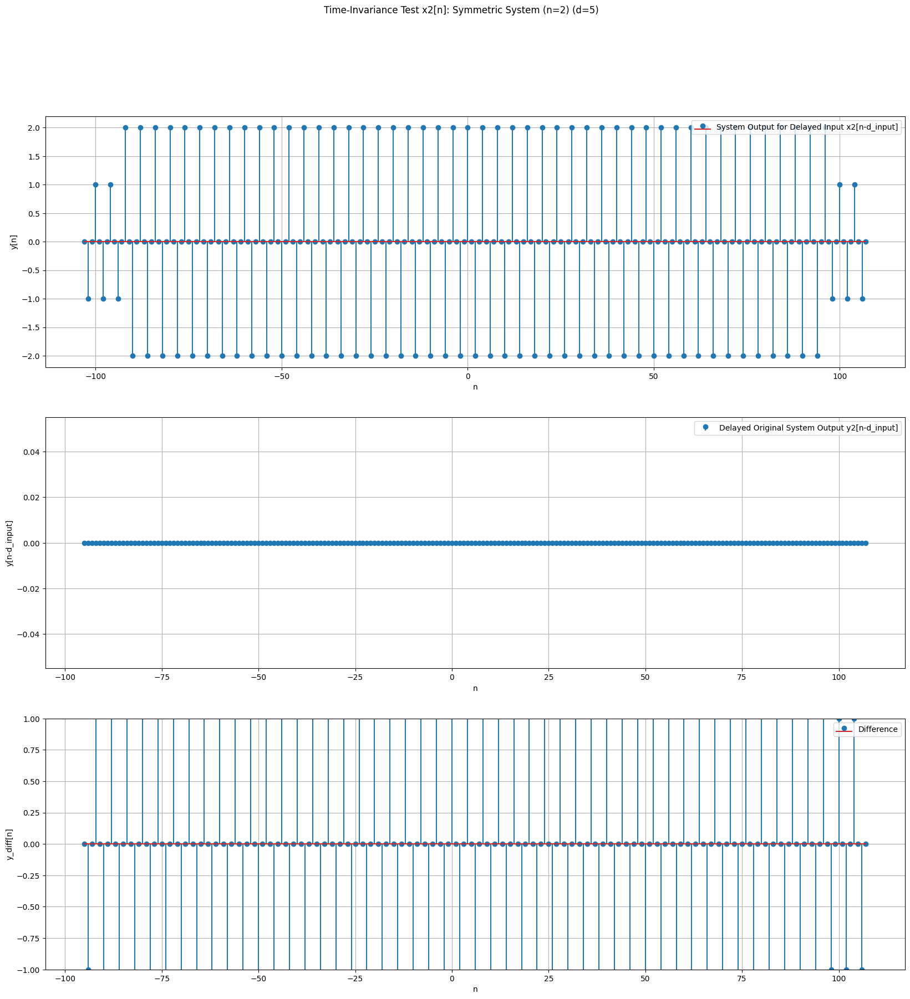

In [ ]:
###############################################
#(a)
################################################
import numpy as np
import matplotlib.pyplot as plt

n = np.arange(-100, 101)
x1 = (0.9**n) * np.where(n >= 0, 1, 0)
x2 = np.sin(np.pi*0.5*n)

plt.figure(figsize=(18,9))

plt.subplot(2,1,1)
plt.stem(n, x1, label='x1[n]')
plt.title("Signal : x1[n] = (0.9^n)u[n]")
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x1[n]")
plt.legend()

plt.subplot(2,1,2)
plt.stem(n, x2, label='x2[n]')
plt.title("Signal : x2[n] = sin(pi0.5n)")
plt.grid(True)
plt.xlabel("n")
plt.ylabel("x2[n]")
plt.legend()
plt.show()

###############################################
#(b)
################################################
#q1_a
y1, n1 = time_reversal(x1,n)
y2, n2 = time_reversal(x2,n)
x = x1 + x2
y, n = time_reversal(x,n)

plt.figure(figsize=(22,22))
plt.suptitle("Linearity : Time Reversal System")

plt.subplot(5,1,1)
plt.stem(n1, y1, label='I = x1[n] : O = y1[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y1[n] = x1[-n]")
plt.legend()

plt.subplot(5,1,2)
plt.stem(n2, y2, label='I = x2[n] : O = y2[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y2[n] = x2[-n]")
plt.legend()

plt.subplot(5,1,3)
plt.stem(n,y,label='I = ax1[n] + bx2[n] : O = y[n]',linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = x1[n] + x2[n]")
plt.legend()

plt.subplot(5,1,4)
plt.stem(n, y1+y2, label ='y1[n] + y2[n]', linefmt = 'r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = y1[n] + y2[n]")
plt.legend()

plt.subplot(5,1,5)
plt.stem(n, y1+y2-y, label ='linearity test : y[n] - y1[n] - y2[n]', linefmt = 'r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] - y1[n] - y2[n]")
plt.legend()
plt.show()

#q1_b xe[n] = (x[n] + x[-n])/2
y1_even, n1_b = even_component(x1,n)
y2_even, n2_b = even_component(x2,n)
y_even , n_b = even_component(x1+x2,n)

plt.figure(figsize=(22,22))
plt.suptitle("Linearity : Even Component System")

plt.subplot(4,1,1)
plt.stem(n1_b, y1_even, label='I = x1[n] : O = y1[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y1[n] = (x1[n]+x1[-n])/2")
plt.legend()

plt.subplot(4,1,2)
plt.stem(n2_b, y2_even, label='I = x2[n] : O = y2[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y2[n] = (x2[n]+x2[-n])/2")
plt.legend()

plt.subplot(4,1,3)
plt.stem(n_b,y_even,label='I = ax1[n] + bx2[n] : O = y[n]',linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n]")
plt.legend()

plt.subplot(4,1,4)
plt.stem(n, y1_even+y2_even, label ='y1[n] + y2[n]', linefmt = 'r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = y1[n] + y2[n]")
plt.legend()
plt.show()

#q1_c xo[n] = (x[n] - x[-n])/2
y1_odd, n1_o = odd_component(x1,n)
y2_odd, n2_o = odd_component(x2,n)
y_odd , n_o = odd_component(x1+x2,n)

plt.figure(figsize=(22,22))
plt.suptitle("Linearity : Odd Component System")

plt.subplot(4,1,1)
plt.stem(n1_o, y1_odd, label='I = x1[n] : O = y1[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y1[n] = (x1[n]-x1[-n])/2")
plt.legend()

plt.subplot(4,1,2)
plt.stem(n2_o, y2_odd, label='I = x2[n] : O = y2[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y2[n] = (x2[n]-x2[-n])/2")
plt.legend()

plt.subplot(4,1,3)
plt.stem(n_o,y_odd,label='I = ax1[n] + bx2[n] : O = y[n]',linefmt = 'y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n]")
plt.legend()

plt.subplot(4,1,4)
plt.stem(n, y1_odd+y2_odd, label ='y1[n] + y2[n]', linefmt = 'r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = y1[n] + y2[n]")
plt.legend()

plt.show()
#q1_d delay system
d = 3
y1_d, n1_d = delay(x1, n, d)
y2_d, n2_d = delay(x2, n, d)

y_d, n_d = delay(x1 + x2, n, d)

plt.figure(figsize=(22,22))
plt.suptitle("Linearity : Delay System (d = 3)")

plt.subplot(4,1,1)
plt.stem(n1_d, y1_d, label='I = x1[n] : O = y1[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y1[n] = x1[n-d]")
plt.legend()

plt.subplot(4,1,2)
plt.stem(n2_d, y2_d, label='I = x2[n] : O = y2[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y2[n] = x2[n-d]")
plt.legend()

plt.subplot(4,1,3)
plt.stem(n_d, y_d, label='I = x1[n] + x2[n] : O = y[n]', linefmt='y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n]")
plt.legend()

plt.subplot(4,1,4)
plt.stem(n, y1_d + y2_d, label='y1[n] + y2[n]', linefmt='r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = y1[n] + y2[n]")
plt.legend()

plt.show()

#q1_e moving average system
m = 10
y1_m ,n1_m = moving_average(x1, n, m)
y2_m, n2_m = moving_average(x2, n, m)
y_m, n_m = moving_average(x1 + x2, n, m)

plt.figure(figsize=(22,22))
plt.suptitle("Linearity : Moving Average System (M = 10)")

plt.subplot(4,1,1)
plt.stem(n1_m, y1_m, label='I = x1[n] : O = y1[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y1[n]")
plt.legend()

plt.subplot(4,1,2)
plt.stem(n2_m, y2_m, label='I = x2[n] : O = y2[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y2[n]")
plt.legend()

plt.subplot(4,1,3)
plt.stem(n_m, y_m, label='I = x1[n] + x2[n] : O = y[n]', linefmt='y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n]")
plt.legend()

plt.subplot(4,1,4)
plt.stem(n_m, y1_m + y2_m, label='y1[n] + y2[n]', linefmt='r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = y1[n] + y2[n]")
plt.legend()

plt.show()
#q1_f backward difference system
y1_b, n1_b = backward_diff(x1, n)
y2_b, n2_b = backward_diff(x2, n)
y_b, n_b = backward_diff(x1 + x2, n)

plt.figure(figsize=(22,22))
plt.suptitle("Linearity : Backward Difference System ")

plt.subplot(4,1,1)
plt.stem(n1_b, y1_b, label='I = x1[n] : O = y1[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y1[n] = x1[n] - x1[n-1]")
plt.legend()

plt.subplot(4,1,2)
plt.stem(n2_b, y2_b, label='I = x2[n] : O = y2[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y2[n] = x2[n] - x2[n-1]")
plt.legend()

plt.subplot(4,1,3)
plt.stem(n_b, y_b, label='I = x1[n] + x2[n] : O = y[n]', linefmt='y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n]")
plt.legend()

plt.subplot(4,1,4)
plt.stem(n_b, y1_b + y2_b, label='y1[n] + y2[n]', linefmt='r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = y1[n] + y2[n]")
plt.legend()

plt.show()
#q1_g second order difference system
y1_s, n1_s = second_order_difference(x1,n)
y2_s, n2_s = second_order_difference(x2,n)
y_s, n_s = second_order_difference(x1 + x2, n)
plt.figure(figsize=(22,22))
plt.suptitle("Linearity : second order difference system ")

plt.subplot(4,1,1)
plt.stem(n1_s, y1_s, label='I = x1[n] : O = y1[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y1[n] = x1[n]−2x1[n-1]+x1[n−2] ")
plt.legend()

plt.subplot(4,1,2)
plt.stem(n2_s, y2_s, label='I = x2[n] : O = y2[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y2[n] = x2[n]−2x2[n-1]+x2[n−2]")
plt.legend()

plt.subplot(4,1,3)
plt.stem(n_s, y_s, label='I = x1[n] + x2[n] : O = y[n]', linefmt='y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n]")
plt.legend()

plt.subplot(4,1,4)
plt.stem(n_s, y1_s + y2_s, label='y1[n] + y2[n]', linefmt='r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = y1[n] + y2[n]")
plt.legend()

plt.show()

#q1_h Squarer System
y1_ss = x1**2
y2_ss = x2**2
y_ss = x1**2 + x2**2

plt.figure(figsize=(22,22))
plt.suptitle("Linearity : Squarer System ")

plt.subplot(4,1,1)
plt.stem(n, y1_ss, label='I = x1[n] : O = y1[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y1[n] = (x1[n])^2 ")
plt.legend()

plt.subplot(4,1,2)
plt.stem(n, y2_ss, label='I = x2[n] : O = y2[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y2[n] = (x2[n])^2")
plt.legend()

plt.subplot(4,1,3)
plt.stem(n, y_ss, label='I = x1[n] + x2[n] : O = y[n]', linefmt='y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n]")
plt.legend()

plt.subplot(4,1,4)
plt.stem(n, y1_ss + y2_ss, label='y1[n] + y2[n]', linefmt='r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = y1[n] + y2[n]")
plt.legend()

plt.show()
#q1_i x[n-2] + x[2-n] i/o relatioship
y1_io, n1_io = symmetrix_2(x1,n)
y2_io, n2_io = symmetrix_2(x2,n)
y_io, n_io = symmetrix_2(x1 + x2, n)

plt.figure(figsize=(22,22))
plt.suptitle("Linearity : x[n-2] + x[2-n]")
plt.subplot(4,1,1)
plt.stem(n1_io, y1_io, label='I = x1[n] : O = y1[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y1[n] = x1[n-2] + x1[2-n]")
plt.legend()

plt.subplot(4,1,2)
plt.stem(n_io, y2_io, label='I = x2[n] : O = y2[n]')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y2[n] = x2n-2] + x2[2-n]")
plt.legend()

plt.subplot(4,1,3)
plt.stem(n_io, y_io, label='I = x1[n] + x2[n] : O = y[n]', linefmt='y-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n]")
plt.legend()

plt.subplot(4,1,4)
plt.stem(n_io, y1_io + y2_io, label='y1[n] + y2[n]', linefmt='r-')
plt.grid(True)
plt.xlabel("n")
plt.ylabel("y[n] = y1[n] + y2[n]")
plt.legend()

plt.show()
###############################################
# (c) Time invariant check (d = 5) for x1[n]
#########################################
####
#q1_a
####
d = 5

y1, n1 = time_reversal(x1, n)
x1d, n1d = delay(x1, n, d)
y_shifted_input, n_shifted_input = time_reversal(x1d, n1d)

y1d, n1d_output = delay(y1, n1, d)

n_common = np.arange(min(min(n_shifted_input), min(n1d_output)),
                     max(max(n_shifted_input), max(n1d_output))+1)

y_shifted_aligned = np.zeros(len(n_common))
y1d_aligned = np.zeros(len(n_common))

for i, ni in enumerate(n_common):
    if ni in n_shifted_input:
        y_shifted_aligned[i] = y_shifted_input[np.where(n_shifted_input == ni)[0][0]]
    if ni in n1d_output:
        y1d_aligned[i] = y1d[np.where(n1d_output == ni)[0][0]]

y_diff = y_shifted_aligned - y1d_aligned

plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x1[n]: Time Reversal System (d = 5)")

plt.subplot(3,1,1)
plt.stem(n_shifted_input, y_shifted_input, label='T{x1[n-d]}')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n1d_output, y1d, basefmt=" ", label='y1[n-d]')
plt.xlabel("n")
plt.ylabel("y[n-d]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_common, y_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

#######
# q1_b Even Component
#######
d = 5  # delay amount

# Original output
y1, n1 = even_component(x1, n)  # y1[n] = Even component of x1[n]

x1d, n1d = delay(x1, n, d)                   # x1[n-d]
y_shifted_input, n_shifted_input = even_component(x1d, n1d)  # Even{x1[n-d]}
y1d, n1d_output = delay(y1, n1, d)

n_common = np.arange(min(min(n_shifted_input), min(n1d_output)),
                     max(max(n_shifted_input), max(n1d_output)) + 1)

# Initialize aligned arrays
y_shifted_aligned = np.zeros(len(n_common))
y1d_aligned = np.zeros(len(n_common))

for i, ni in enumerate(n_common):
    if ni in n_shifted_input:
        y_shifted_aligned[i] = y_shifted_input[np.where(n_shifted_input == ni)[0][0]]
    if ni in n1d_output:
        y1d_aligned[i] = y1d[np.where(n1d_output == ni)[0][0]]

# Difference
y_diff = y_shifted_aligned - y1d_aligned

# ---- Plotting ----
plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x1[n]: Even Component (d = 5)")

plt.subplot(3,1,1)
plt.stem(n_shifted_input, y_shifted_input, label='Even{x1[n-d]}')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n1d_output, y1d, basefmt=" ", label='Even{x1[n]}[n-d]')
plt.xlabel("n")
plt.ylabel("y[n-d]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_common, y_diff, label='Difference (should NOT be zero)')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

#######
#q1_c
#######
d = 5  # delay amount

# Original output
y1, n1 = odd_component(x1, n)  # y1[n] = Odd component of x1[n]

x1d, n1d = delay(x1, n, d)                     # x1[n-d]
y_shifted_input, n_shifted_input = odd_component(x1d, n1d)  # Odd{x1[n-d]}

# Shift original output
y1d, n1d_output = delay(y1, n1, d)             # Odd{x1[n]}[n-d]

n_min = min(n_shifted_input[0], n1d_output[0])
n_max = max(n_shifted_input[-1], n1d_output[-1])
n_common = np.arange(n_min, n_max + 1)

y_shifted_aligned = np.zeros(len(n_common))
y1d_aligned = np.zeros(len(n_common))

for i, k in enumerate(n_shifted_input):
    y_shifted_aligned[np.where(n_common == k)[0][0]] = y_shifted_input[i]

for i, k in enumerate(n1d_output):
    y1d_aligned[np.where(n_common == k)[0][0]] = y1d[i]

# Difference
y_diff = y_shifted_aligned - y1d_aligned

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x1[n]: Odd Component (d = 5)")

plt.subplot(3,1,1)
plt.stem(n_common, y_shifted_aligned, label='Odd{x1[n-d]}')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n_common, y1d_aligned, basefmt=" ", label='Odd{x1[n]}[n-d]')
plt.xlabel("n")
plt.ylabel("y[n-d]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_common, y_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

#######
#q1_d
#######
# Parameters
d_system = 5
d_input = 5


y1, n1 = delay(x1, n, d_system)  # y1[n] = x1[n-d_system]


x1_shifted, n_shifted_input = delay(x1, n, d_input)  # x1[n-d_input]
y_shifted_input, n_y_shifted_input = delay(x1_shifted, n_shifted_input, d_system)  # delay system output


y1d, n1d_output = delay(y1, n1, d_input)  # y1[n-d_input]


n_min = min(n_y_shifted_input[0], n1d_output[0])
n_max = max(n_y_shifted_input[-1], n1d_output[-1])
n_common = np.arange(n_min, n_max + 1)


y_shifted_aligned = np.zeros(len(n_common))
y1d_aligned = np.zeros(len(n_common))

for i, k in enumerate(n_y_shifted_input):
    y_shifted_aligned[np.where(n_common == k)[0][0]] = y_shifted_input[i]

for i, k in enumerate(n1d_output):
    y1d_aligned[np.where(n_common == k)[0][0]] = y1d[i]

# Difference
y_diff = y_shifted_aligned - y1d_aligned


plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x1[n]: Delay System")

plt.subplot(3,1,1)
plt.stem(n_common, y_shifted_aligned, label='System Output for Delayed Input x1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n_common, y1d_aligned, basefmt=" ", label='Delayed Original System Output y1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_common, y_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

######
#q1_e
######
# Parameters
m = 10
d_input = 5


y1, n1 = moving_average(x1, n, m)  # y1[n] = moving_average(x1, m)


x1_shifted, n_shifted_input = delay(x1, n, d_input)
y_shifted_input, n_y_shifted_input = moving_average(x1_shifted, n_shifted_input, m)


y1d, n1d_output = delay(y1, n1, d_input)


n_min = min(n_y_shifted_input[0], n1d_output[0])
n_max = max(n_y_shifted_input[-1], n1d_output[-1])
n_common = np.arange(n_min, n_max + 1)

y_shifted_aligned = np.zeros(len(n_common))
y1d_aligned = np.zeros(len(n_common))

for i, k in enumerate(n_y_shifted_input):
    y_shifted_aligned[np.where(n_common == k)[0][0]] = y_shifted_input[i]

for i, k in enumerate(n1d_output):
    y1d_aligned[np.where(n_common == k)[0][0]] = y1d[i]

# Difference
y_diff = y_shifted_aligned - y1d_aligned

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle(f"Time-Invariance Test x1[n]: Moving Average System (m={m}, d={d_input})")

plt.subplot(3,1,1)
plt.stem(n_common, y_shifted_aligned, label='System Output for Delayed Input x1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n_common, y1d_aligned, basefmt=" ", label='Delayed Original System Output y1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_common, y_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

######
#q1_f
######
# Parameters
d_input = 5

y1, n1 = backward_diff(x1, n)
x1_shifted, n_shifted_input = delay(x1, n, d_input)
y_shifted_input, n_y_shifted_input = backward_diff(x1_shifted, n_shifted_input)
y1d, n1d_output = delay(y1, n1, d_input)


n_min = min(n_y_shifted_input[0], n1d_output[0])
n_max = max(n_y_shifted_input[-1], n1d_output[-1])
n_common = np.arange(n_min, n_max + 1)


y_shifted_aligned = np.zeros(len(n_common))
y1d_aligned = np.zeros(len(n_common))

for i, k in enumerate(n_y_shifted_input):
    y_shifted_aligned[np.where(n_common == k)[0][0]] = y_shifted_input[i]

for i, k in enumerate(n1d_output):
    y1d_aligned[np.where(n_common == k)[0][0]] = y1d[i]


y_diff = y_shifted_aligned - y1d_aligned


plt.figure(figsize=(20,20))
plt.suptitle(f"Time-Invariance Test x1[n]: Backward Difference System (d={d_input})")

plt.subplot(3,1,1)
plt.stem(n_common, y_shifted_aligned, label='System Output for Delayed Input x1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n_common, y1d_aligned, basefmt=" ", label='Delayed Original System Output y1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_common, y_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

######
#q1_g
######
# Parameters
d_input = 5  # delay applied to input for testing

# 1. Output of system for original input
y1, n1 = second_order_difference(x1, n)

# 2. Shift input and compute system output
x1_shifted, n_shifted_input = delay(x1, n, d_input)
y_shifted_input, n_y_shifted_input = second_order_difference(x1_shifted, n_shifted_input)

# 3. Shift original output
y1d, n1d_output = delay(y1, n1, d_input)

n_min = min(n_y_shifted_input[0], n1d_output[0])
n_max = max(n_y_shifted_input[-1], n1d_output[-1])
n_common = np.arange(n_min, n_max + 1)

# Initialize aligned arrays
y_shifted_aligned = np.zeros(len(n_common))
y1d_aligned = np.zeros(len(n_common))

# Place values into aligned arrays
for i, k in enumerate(n_y_shifted_input):
    idx = np.where(n_common == k)[0][0]
    y_shifted_aligned[idx] = y_shifted_input[i]

for i, k in enumerate(n1d_output):
    idx = np.where(n_common == k)[0][0]
    y1d_aligned[idx] = y1d[i]

# Difference
y_diff = y_shifted_aligned - y1d_aligned

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle(f"Time-Invariance Test x1[n]: Second-Order Difference System (d={d_input})")

plt.subplot(3,1,1)
plt.stem(n_common, y_shifted_aligned, label='System Output for Delayed Input x1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n_common, y1d_aligned, basefmt=" ", label='Delayed Original System Output y1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_common, y_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

#######
#q1_h
#######
d = 5  # delay amount

# Original output of squaring system
y1 = x1**2  # y1[n] = x1[n]^2
n1 = n

# Shift input and compute output
x1d, n1d = delay(x1, n, d)         # x1[n-d]
y_shifted_input = x1d**2           # (x[n-d])^2
n_shifted_input = n1d

# Shift original output
y1d, n1d_output = delay(y1, n1, d)  # y1[n-d]

# Align arrays for difference using a common index axis
n_min = min(n_shifted_input[0], n1d_output[0])
n_max = max(n_shifted_input[-1], n1d_output[-1])
n_common = np.arange(n_min, n_max + 1)

# Initialize aligned arrays
y_shifted_aligned = np.zeros(len(n_common))
y1d_aligned = np.zeros(len(n_common))

# Place values into aligned arrays
for i, k in enumerate(n_shifted_input):
    idx = np.where(n_common == k)[0][0]
    y_shifted_aligned[idx] = y_shifted_input[i]

for i, k in enumerate(n1d_output):
    idx = np.where(n_common == k)[0][0]
    y1d_aligned[idx] = y1d[i]

# Difference
y_diff = y_shifted_aligned - y1d_aligned

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x1[n]: Squaring System (y[n] = x[n]^2, d = 5)")

plt.subplot(3,1,1)
plt.stem(n_common, y_shifted_aligned, label='System Output for Delayed Input (x[n-d])^2')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n_common, y1d_aligned, basefmt=" ", label='Delayed Original System Output y1[n-d]')
plt.xlabel("n")
plt.ylabel("y[n-d]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_common, y_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-2,2)

plt.show()
######
#q1_i
######
# Parameters
d_input = 5  # delay applied to input for testing

# 1. Output of symmetric system for original input
y1, n1 = symmetrix_2(x1, n)

# 2. Shift input and compute system output
x1_shifted, n_shifted_input = delay(x1, n, d_input)
y_shifted_input, n_y_shifted_input = symmetrix_2(x1_shifted, n_shifted_input)

# 3. Shift original output
y1d, n1d_output = delay(y1, n1, d_input)

# --- Fix: Align signals over a common index ---
n_common = np.intersect1d(n_y_shifted_input, n1d_output)

y_aligned_shifted = [y_shifted_input[np.where(n_y_shifted_input == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y1d[np.where(n1d_output == ni)[0][0]] for ni in n_common]

# Difference
y_diff = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n_diff = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle(f"Time-Invariance Test x1[n]: Symmetric System (n=2) (d={d_input})")

plt.subplot(3,1,1)
plt.stem(n_y_shifted_input, y_shifted_input, label='System Output for Delayed Input x1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n1d_output, y1d, basefmt=" ", label='Delayed Original System Output y1[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_diff, y_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)
plt.show()

###############################################
# (c) Time invariant check (d = 5) for x2[n]
#########################################
####
#q1_a
####
d = 5  # delay amount

# Original output for x2[n]
y2_orig, n2_orig = time_reversal(x2, n)

# Shift input and compute output
x2_delayed, n2_delayed_input = delay(x2, n, d)
y2_shifted_input, n2_shifted_input = time_reversal(x2_delayed, n2_delayed_input)  # T{x2[n-d]}

# Shift original output
y2_delayed_output, n2_delayed_output = delay(y2_orig, n2_orig, d)  # y2[n-d]

# --- Align over common n values ---
n_common = np.intersect1d(n2_shifted_input, n2_delayed_output)

y_aligned_shifted = [y2_shifted_input[np.where(n2_shifted_input == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y2_delayed_output[np.where(n2_delayed_output == ni)[0][0]] for ni in n_common]

y2_diff = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n2_diff = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x2[n]: Time Reversal System (d = 5)")

plt.subplot(3,1,1)
plt.stem(n2_shifted_input, y2_shifted_input, label='T{x2[n-d]} = x[-n-d]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n2_delayed_output, y2_delayed_output, basefmt=" ", label='y2[n-d] = x[d-n]')
plt.xlabel("n")
plt.ylabel("y[n-d]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n2_diff, y2_diff, label='Difference (should NOT be 0)')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.show()

#######
#q1_b
#######
d = 5  # delay amount

# Original output for x2[n]
y2_orig, n2_orig = even_component(x2, n)  # y2[n] = Even component of x2[n]

# Shift input and compute output
x2_delayed, n2_delayed_input = delay(x2, n, d)
y2_shifted_input, n2_shifted_input = even_component(x2_delayed, n2_delayed_input)

# Shift original output
y2_delayed_output, n2_delayed_output = delay(y2_orig, n2_orig, d)

# --- Align arrays properly over common n values ---
n_common = np.intersect1d(n2_shifted_input, n2_delayed_output)

y_aligned_shifted = [y2_shifted_input[np.where(n2_shifted_input == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y2_delayed_output[np.where(n2_delayed_output == ni)[0][0]] for ni in n_common]

y2_diff = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n2_diff = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x2[n]: Even Component System (d = 5)")

plt.subplot(3,1,1)
plt.stem(n2_shifted_input, y2_shifted_input, label='Even{x2[n-d]}')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n2_delayed_output, y2_delayed_output, basefmt=" ", label='Even{x2[n]} shifted: y[n-d]')
plt.xlabel("n")
plt.ylabel("y[n-d]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n2_diff, y2_diff, label='Difference (should be ~0)')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)
plt.show()

######
#q1_c
######
d = 5  # delay amount

# Original output for x2[n]
y2_orig, n2_orig = odd_component(x2, n)   # y2[n] = Odd component of x2[n]

# Shift input and compute output
x2_delayed, n2_delayed_input = delay(x2, n, d)      # x2[n-d]
y2_shifted_input, n2_shifted_input = odd_component(x2_delayed, n2_delayed_input)  # Odd component of delayed input

# Shift original output
y2_delayed_output, n2_delayed_output = delay(y2_orig, n2_orig, d)   # y2[n-d]

# Align arrays using common indices
n_common = np.intersect1d(n2_shifted_input, n2_delayed_output)

y_aligned_shifted = [y2_shifted_input[np.where(n2_shifted_input == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y2_delayed_output[np.where(n2_delayed_output == ni)[0][0]] for ni in n_common]

y2_diff = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n2_diff = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x2[n]: Odd Component System (d = 5)")

plt.subplot(3,1,1)
plt.stem(n2_shifted_input, y2_shifted_input, label='Odd{x2[n-d]}')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n2_delayed_output, y2_delayed_output, basefmt=" ", label='Odd{x2[n]}[n-d]')
plt.xlabel("n")
plt.ylabel("y[n-d]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n2_diff, y2_diff, label='Difference (should be ~0)')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)
plt.show()

#######
#q1_d
#######
# Parameters
d_system = 5   # delay implemented by the system
d_input = 5    # delay applied to the input for testing time invariance

# 1. Output of system for original input
y2_orig, n2_orig = delay(x2, n, d_system)  # y2[n] = x2[n-d_system]

# 2. Shift input and compute system output
x2_shifted, n2_shifted_input = delay(x2, n, d_input)  # x2[n-d_input]
y2_shifted_input, n2_y_shifted_input = delay(x2_shifted, n2_shifted_input, d_system)  # system output

# 3. Shift original output
y2_delayed_output, n2_delayed_output = delay(y2_orig, n2_orig, d_input)  # y2[n-d_input]

# 4. Align arrays using common n values
n_common = np.intersect1d(n2_y_shifted_input, n2_delayed_output)

y_aligned_shifted = [y2_shifted_input[np.where(n2_y_shifted_input == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y2_delayed_output[np.where(n2_delayed_output == ni)[0][0]] for ni in n_common]

y2_diff = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n2_diff = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x2[n]: Delay System")

plt.subplot(3,1,1)
plt.stem(n2_y_shifted_input, y2_shifted_input,
         label='System Output for Delayed Input x2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n2_delayed_output, y2_delayed_output, basefmt=" ",
         label='Delayed Original System Output y2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n2_diff, y2_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

######
#q1e
######
# Parameters
m = 10        # moving average window length
d_input = 5   # delay applied to input to test time invariance

# 1. Output of system for original input
y2_orig, n2_orig = moving_average(x2, n, m)

# 2. Shift input and compute system output
x2_shifted, n2_shifted_input = delay(x2, n, d_input)  # x2[n-d_input]
y2_shifted_input, n2_y_shifted_input = moving_average(x2_shifted, n2_shifted_input, m)

# 3. Shift original output
y2_delayed_output, n2_delayed_output = delay(y2_orig, n2_orig, d_input)  # y2[n-d_input]

# 4. Align arrays using common n values
n_common = np.intersect1d(n2_y_shifted_input, n2_delayed_output)

y_aligned_shifted = [y2_shifted_input[np.where(n2_y_shifted_input == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y2_delayed_output[np.where(n2_delayed_output == ni)[0][0]] for ni in n_common]

y2_diff = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n2_diff = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle(f"Time-Invariance Test x2[n]: Moving Average System (m={m}, d={d_input})")

plt.subplot(3,1,1)
plt.stem(n2_y_shifted_input, y2_shifted_input, label='System Output for Delayed Input x2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n2_delayed_output, y2_delayed_output, basefmt=" ", label='Delayed Original System Output y2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n2_diff, y2_diff, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

######
#q1f
######
d_input = 5  # delay applied to input for testing

# 1. Output of backward difference system for original input
y2_orig, n2_orig = backward_diff(x2, n)

# 2. Shift input and compute system output
x2_shifted, n2_shifted_input = delay(x2, n, d_input)  # x2[n-d_input]
y2_shifted_input, n2_y_shifted_input = backward_diff(x2_shifted, n2_shifted_input)

# 3. Shift original output
y2_delayed_output, n2_delayed_output = delay(y2_orig, n2_orig, d_input)  # y2[n-d_input]

# 4. Align arrays using common n values
n_common = np.intersect1d(n2_y_shifted_input, n2_delayed_output)

y_aligned_shifted = [y2_shifted_input[np.where(n2_y_shifted_input == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y2_delayed_output[np.where(n2_delayed_output == ni)[0][0]] for ni in n_common]

y_diff2 = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n_diff2 = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle(f"Time-Invariance Test x2[n]: Backward Difference System (d={d_input})")

plt.subplot(3,1,1)
plt.stem(n2_y_shifted_input, y2_shifted_input, label='System Output for Delayed Input x2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n2_delayed_output, y2_delayed_output, basefmt=" ", label='Delayed Original System Output y2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_diff2, y_diff2, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

#####
#q1g
#####
d_input = 5  # delay applied to input for testing

# 1. Original system output
y2_orig, n2_orig = second_order_difference(x2, n)

# 2. Output for delayed input
x2_shifted, n2_shifted_input = delay(x2, n, d_input)  # x2[n-d_input]
y2_shifted_input, n2_y_shifted_input = second_order_difference(x2_shifted, n2_shifted_input)

# 3. Delayed original output
y2_delayed_output, n2_delayed_output = delay(y2_orig, n2_orig, d_input)

# 4. Align arrays using common n values
n_common = np.intersect1d(n2_y_shifted_input, n2_delayed_output)

y_aligned_shifted = [y2_shifted_input[np.where(n2_y_shifted_input == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y2_delayed_output[np.where(n2_delayed_output == ni)[0][0]] for ni in n_common]

y_diff2 = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n_diff2 = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle(f"Time-Invariance Test x2[n]: Second-Order Difference System (d={d_input})")

plt.subplot(3,1,1)
plt.stem(n2_y_shifted_input, y2_shifted_input, label='System Output for Delayed Input x2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n2_delayed_output, y2_delayed_output, basefmt=" ", label='Delayed Original System Output y2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_diff2, y_diff2, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

#####
#q1h
#####
d = 5  # delay amount

# Original output
y2_orig = x2**2
n2_orig = n

# Shift input and compute output
x2_delayed, n2_delayed_input = delay(x2, n, d)
y2_shifted_input = x2_delayed**2
n2_shifted_input = n2_delayed_input

# Shift original output
y2_delayed_output, n2_delayed_output = delay(y2_orig, n2_orig, d)

# Align using common n values
n_common = np.intersect1d(n2_shifted_input, n2_delayed_output)

y_aligned_shifted = [y2_shifted_input[np.where(n2_shifted_input == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y2_delayed_output[np.where(n2_delayed_output == ni)[0][0]] for ni in n_common]

y_diff2 = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n_diff2 = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle("Time-Invariance Test x2[n]: Squaring System (y[n] = x[n]^2, d = 5)")

plt.subplot(3,1,1)
plt.stem(n2_shifted_input, y2_shifted_input, label='System Output for Delayed Input (x2[n-d])^2')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n2_delayed_output, y2_delayed_output, basefmt=" ", label='Delayed Original System Output y2[n-d]')
plt.xlabel("n")
plt.ylabel("y[n-d]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_diff2, y_diff2, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)

plt.show()

#####
#q1i
#####
# Parameters
d_input = 5  # delay applied to input for testing

# 1. Output of symmetric system for original input
y2_orig, n2_orig = symmetrix_2(x2, n)

# 2. Shift input and compute system output
x2_shifted, n2_shifted_input = delay(x2, n, d_input)  # x2[n-d_input]
y2_shifted_input, n2_shifted_output = symmetrix_2(x2_shifted, n2_shifted_input)

# 3. Shift original output
y2_delayed_output, n2_delayed_output = delay(y2_orig, n2_orig, d_input)  # delayed original output

# 4. Align using common n-values
n_common = np.intersect1d(n2_shifted_output, n2_delayed_output)

y_aligned_shifted = [y2_shifted_input[np.where(n2_shifted_output == ni)[0][0]] for ni in n_common]
y_aligned_delayed = [y2_delayed_output[np.where(n2_delayed_output == ni)[0][0]] for ni in n_common]

y_diff2 = np.array(y_aligned_shifted) - np.array(y_aligned_delayed)
n_diff2 = n_common

# Plotting
plt.figure(figsize=(20,20))
plt.suptitle(f"Time-Invariance Test x2[n]: Symmetric System (n=2) (d={d_input})")

plt.subplot(3,1,1)
plt.stem(n2_shifted_output, y2_shifted_input, label='System Output for Delayed Input x2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,2)
plt.stem(n2_delayed_output, y2_delayed_output, basefmt=" ", label='Delayed Original System Output y2[n-d_input]')
plt.xlabel("n")
plt.ylabel("y[n-d_input]")
plt.grid(True)
plt.legend()

plt.subplot(3,1,3)
plt.stem(n_diff2, y_diff2, label='Difference')
plt.xlabel("n")
plt.ylabel("y_diff[n]")
plt.grid(True)
plt.legend()
plt.ylim(-1,1)
plt.show()




<h4> <b> Report your observations : </b> </h4> <dt> <h4> i. The Time reversal system Flips the signal with respect to the vertical axis (time axis). It preserves linearity but violates time invariance because delaying the input does not produce the same delayed output. Hence, it is **not an LTI system**. </h4> </dt> <dt> <h4> ii. the Even and odd component systems Extract the symmetric (even) and antisymmetric (odd) parts of x[n]. They preserve linearity but violate time invariance, since they involve x[-n], which does not shift in the same way as the input. Hence, they are not LTI systems. </h4> </dt> <dt> <h4> iii. An Ideal delay system Shifts the signal by d samples to the right or left depending on the value of d. It preserves linearity and time invariance, hence it is an LTI system. </h4> </dt> <dt> <h4> iv. The Moving average system (M = 10) Smooths the input signal, reducing high-frequency fluctuations. Summation is linear, so it preserves linearity. The system is time-invariant, as a delayed input produces an equally delayed output. Hence, it is an LTI system. </h4> </dt> <dt> <h4> v. The Difference systems (backward and second-order) Highlight rapid changes and edges, enhancing curvature in the signal. They **preserve linearity** and are time-invariant, as verified by the difference plot (y_diff = 0). These systems are LTI systems, but they are not memoryless, since the output depends on past input samples. </h4> </dt> <dt> <h4> vi. The Squarer system Produces y[n] = x^2[n]. It is time-invariant, but non-linear because squaring does not satisfy superposition. Hence, it is not an LTI system. </h4> </dt> <dt> <h4> vii. The System y[n] = x[n-2] + x[2-n]is Linear, but not time-invariant due to the x[2-n] term (depends on mirrored time). The output depends on future and past values. Hence, it is not an LTI system. </h4> </dt>


<h4> <b> Part (3) : Linear Time-Invariant (LTI) Systems on natural signals : </b>

<dt> <h4> For LTI systems, the output of the system for any arbitrary input can be determined using the convolution sum </h4> </dt>

<dt> <h4> <center> $y[n] = \sum\limits_{k=-∞}^{+\infty} x[n] \cdot h[n-k]  $ </center> </h4> </dt>

<dt> <h4> Where y[n] is the output of the LTI system, x[n] is the input signals and h[n] is the impulse response of the discrete time system   </dt> </h4>

<h4> <b> Programming Questions : </b>  

<dt> <h4> a. Write a Python function that accepts two one dimensional input sequences and linearly convolves them. </h4> </dt>

<dt> <h4> b. Verify your convolution functions using the following set of inputs. Plot the input and output sequences using plt.stem() function and report your observations. </h4> </dt>


<dd> <h4> - Ideal distortionless system <center> $x[n] = u[n] - u[n-6]$   $\hspace{1cm}$ $h[n] = \delta[n] $ </center> </h4> </dd>

<dd> <h4> - Ideal delay system <center> $x[n] = u[n] - u[n-6]$   $\hspace{1cm}$ $h[n] = \delta[n-1] $ </center> </h4> </dd>


<dd> <h4> - Moving average system : Let $ x_{1}[n] = sin(2\pi\frac{10}{8000}n) $ and $x_{2}[n]=sin(2\pi\frac{100}{8000}n)$ <center> $x[n] = x_{1}[n] + x_{2}[n]$   $\hspace{1cm}$ $h[n] = \frac{1}{M+1} \sum\limits_{k=0}^{M} \delta[n-k] $ </center> </h4> </dd>

<dd><h4> You may consider around 4000 discrete time instants (n) while plotting the input and output sequences. Please set the linewidth of stemlines of plt.stem() function to zero for better visualization of the input and output sequences. Experiment with the window size (M) in the moving average system and report your observations.    </h4> </dd>


<dd> <h4> - Backward difference system <center> $x[n] = u[n] - u[n-6] $   $\hspace{1cm}$ $h[n] = \delta[n] - \delta[n-1] $ </center> </h4> </dd>



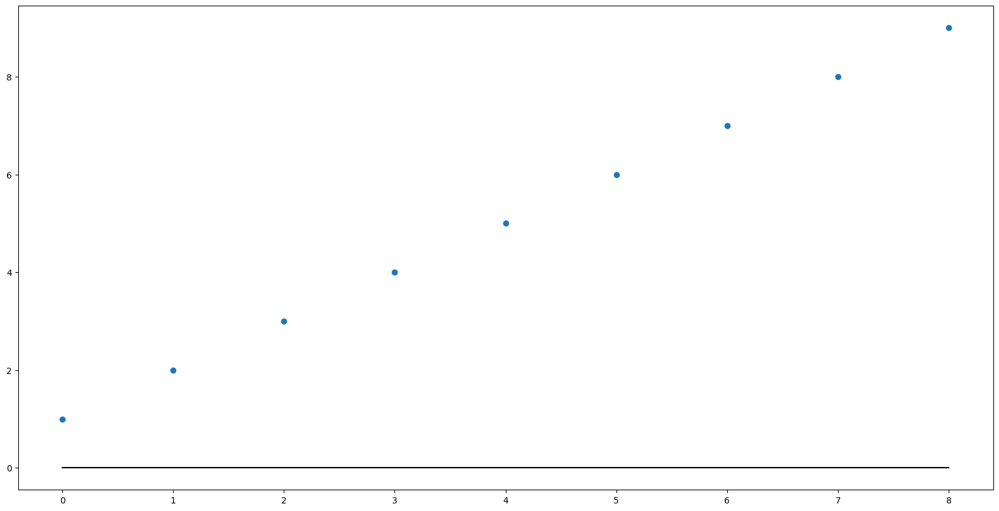

In [ ]:
######################################
#Code snippet to set the linewidth of stemlines in plt.stem() function to zero
######################################
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

x=np.array([*range(1,10)]) #discrete instants of time

plt.figure(figsize=(20,10)) #Define the figure size
markerline, stemlines, baseline = plt.stem(x)
plt.setp(stemlines,linewidth=0)
baseline.set_color("k")
plt.show()


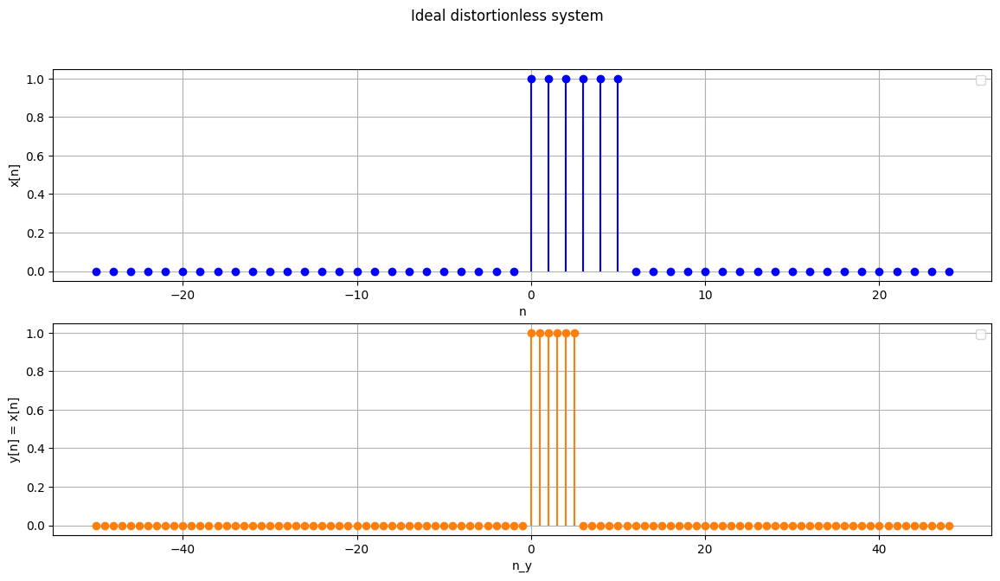

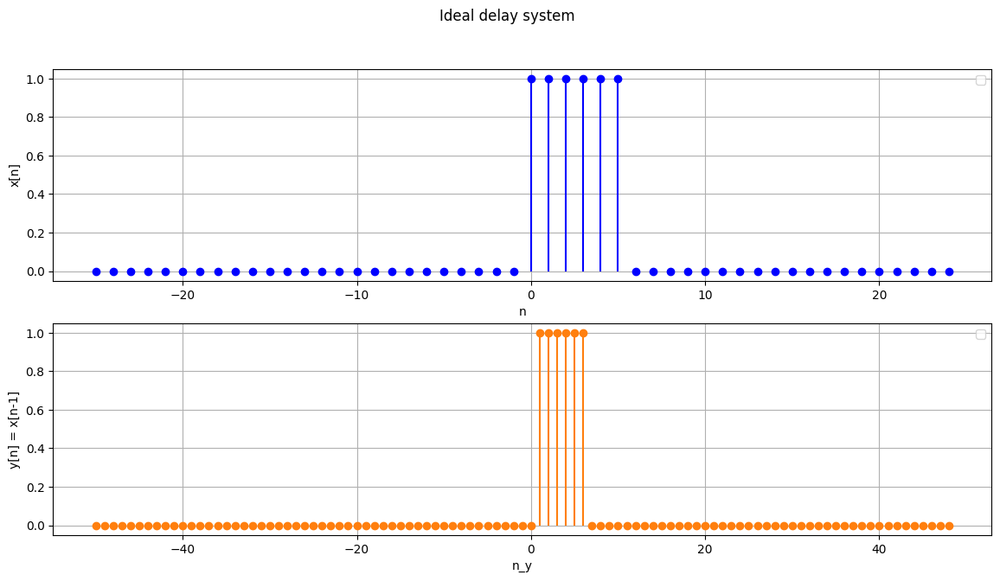

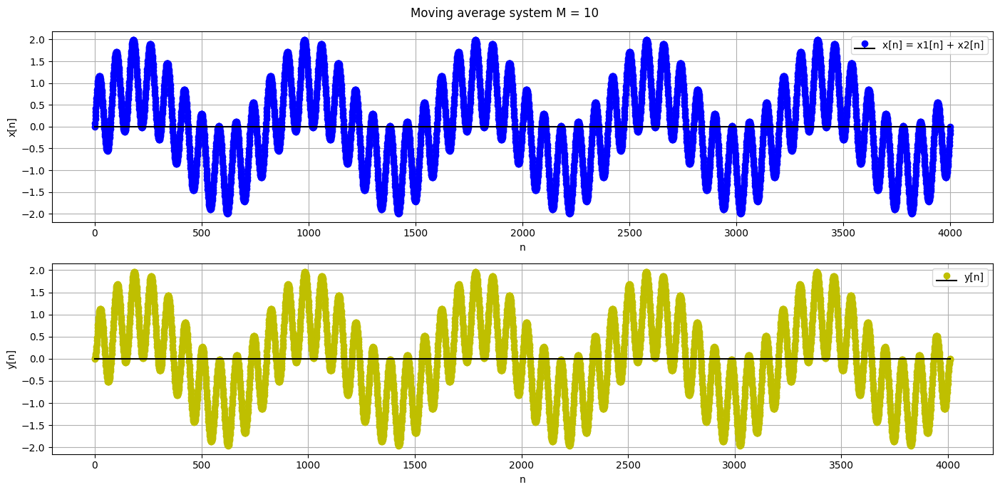

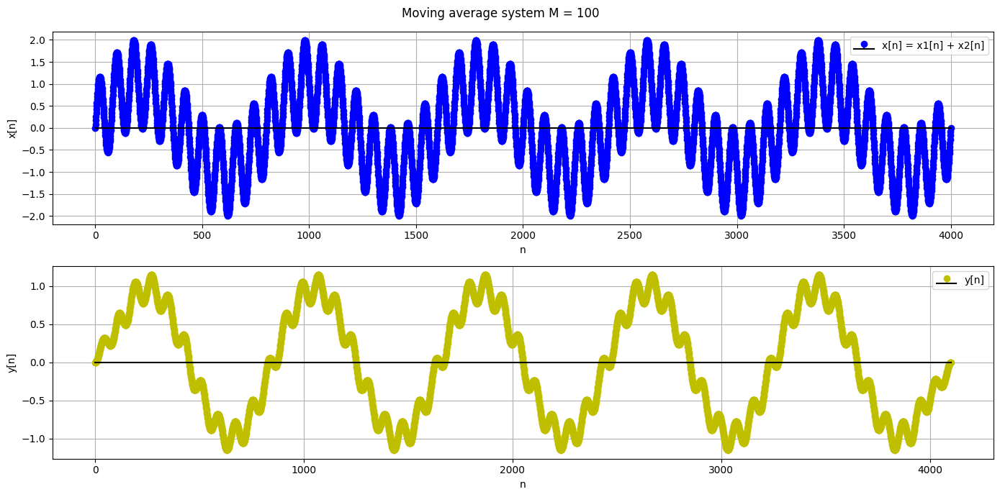

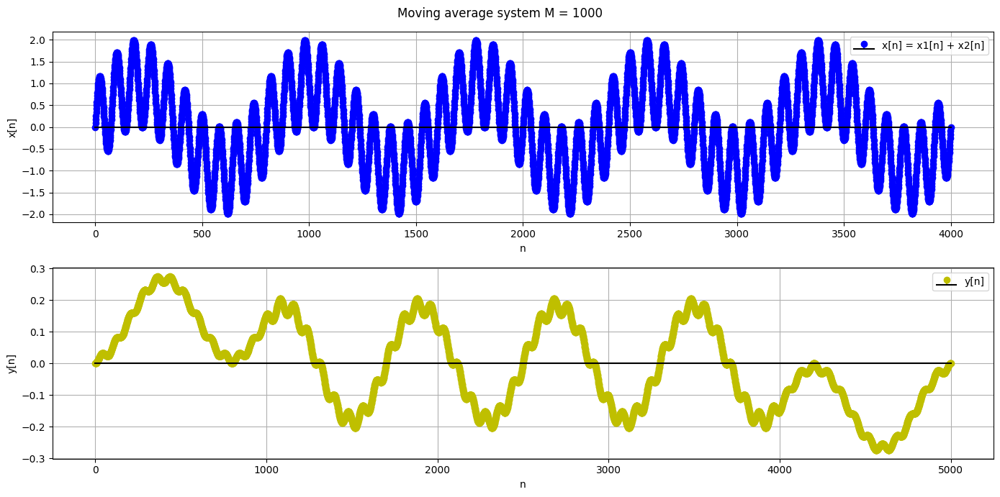

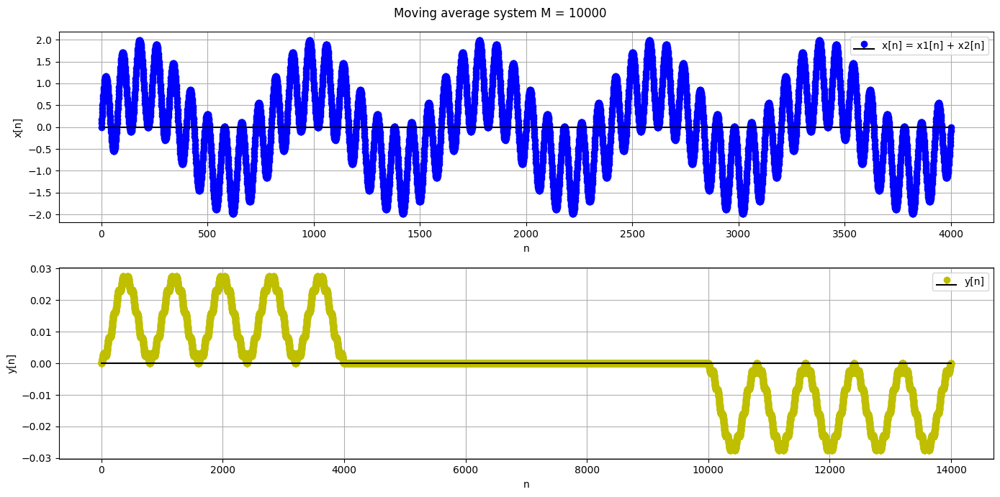

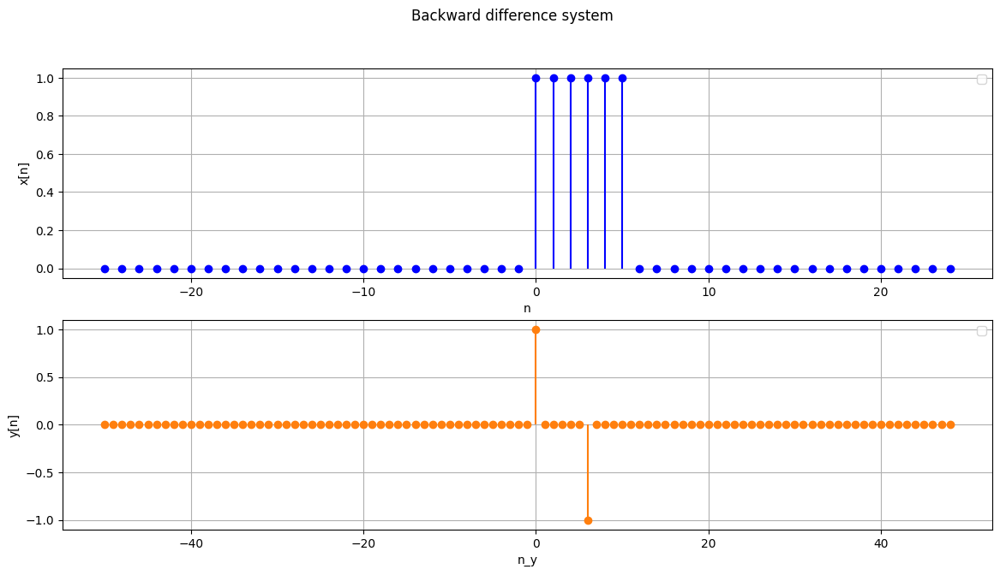

In [ ]:
######################################
#Write a function to compute the convolution sum of two sequences
######################################
def linear_convolution(x,h):
  N = len(x)
  M = len(h)
  y = np.zeros(N+M-1)
  for n in range(len(y)):
    for k in range(M):
      if 0<= n - k < N :
        y[n] += x[n-k] * h[k]
  return y

def u(n):
  return np.array(n>=0, dtype = int)

def delta(n):
  return np.array(n==0, dtype = int)

n = np.arange(-25, 25)

######################################
#Ideal distortionless system
######################################
x = u(n) - u(n-6)
h = delta(n)

y = linear_convolution(x,h)

ny = np.arange(2*n[0], 2*n[-1] + 1)

plt.figure(figsize=(14,7))
plt.suptitle("Ideal distortionless system")

plt.subplot(2,1,1)
plt.stem(n, x, linefmt='b-', basefmt=" ")
plt.grid(True)
plt.ylabel('x[n]')
plt.xlabel('n')
plt.legend()

plt.subplot(2,1,2)
plt.stem(ny, y, linefmt='C1-', basefmt=" ")
plt.grid(True)
plt.ylabel('y[n] = x[n]')
plt.xlabel('n_y')
plt.legend()
plt.show()

######################################
#Ideal delay system
######################################
xd = u(n) - u(n-6)
hd = delta(n-1)

yd = linear_convolution(xd,hd)

nyd = np.arange(2*n[0], 2*n[-1] + 1)

plt.figure(figsize=(14,7))
plt.suptitle("Ideal delay system")

plt.subplot(2,1,1)
plt.stem(n, xd, linefmt='b-', basefmt=" ")
plt.grid(True)
plt.ylabel('x[n]')
plt.xlabel('n')
plt.legend()

plt.subplot(2,1,2)
plt.stem(nyd, yd, linefmt='C1-', basefmt=" ")
plt.grid(True)
plt.ylabel('y[n] = x[n-1]')
plt.xlabel('n_y')
plt.legend()
plt.show()

######################################
#Moving average system
######################################

nm = np.arange(0,4001)

x1 = np.sin(2*np.pi*(10/8000)*nm)
x2 = np.sin(2*np.pi*(100/8000)*nm)
x = x1+x2

M_values = np.array([10, 100, 1000, 10000])

for M in M_values:
    h = np.ones(M + 1) / (M + 1)
    y = linear_convolution(x, h)
    ny = np.arange(0, len(y))

    plt.figure(figsize=(14, 7))
    plt.suptitle(f"Moving average system M = {M}")

    ax1 = plt.subplot(2, 1, 1)
    markerline, stemlines, baseline = ax1.stem(nm, x, linefmt='b-', basefmt='k-')
    plt.setp(stemlines, linewidth=0)
    baseline.set_color("k")
    ax1.set_ylabel("x[n]")
    ax1.set_xlabel("n")
    ax1.grid(True)
    ax1.legend(['x[n] = x1[n] + x2[n]'])

    ax2 = plt.subplot(2, 1, 2)
    markerline, stemlines, baseline = ax2.stem(ny, y, linefmt='y-', basefmt='k-')
    plt.setp(stemlines, linewidth=0)
    baseline.set_color("k")
    ax2.set_ylabel("y[n]")
    ax2.set_xlabel("n")
    ax2.grid(True)
    ax2.legend([f'y[n]'])

    plt.tight_layout()
    plt.show()

######################################
#Backward difference system
######################################
xb = u(n) - u(n-6)
hb = delta(n) - delta(n-1)

yb = linear_convolution(xb,hb)

nyb = np.arange(2*n[0], 2*n[-1] + 1)

plt.figure(figsize=(14,7))
plt.suptitle("Backward difference system")

plt.subplot(2,1,1)
plt.stem(n, xb, linefmt='b-', basefmt=" ")
plt.grid(True)
plt.ylabel('x[n]')
plt.xlabel('n')
plt.legend()

plt.subplot(2,1,2)
plt.stem(nyb, yb, linefmt='C1-', basefmt=" ")
plt.grid(True)
plt.ylabel('y[n]')
plt.xlabel('n_y')
plt.legend()
plt.show()



<h4> <b> Report your observations : </b>  

<dt> <h4> i. In an ideal distortionless system the output y[n] is same as the input x[n]. There is no change in shape, amplitude or duration which confirms distortionless.
</h4> </dt>
<dt> <h4> ii. In the second part, ideal delay system with h[n] = δ[n-1], the ouput is identical to the input but it is shifted by one sample to the right. only timining is affected shape and amplitude remain the same.  
</h4> </dt>
<dt> <h4> iii. As the value of M increases the high frequency components get reduced, it acts as a low pass filter resulting in more smoothing of the signal. For small values of M output resembles the input.
 </h4> </dt>
 <dt> <h4> iv. In the backward difference system the output shows difference between successive samples of the input. Returns spikes at the edges, positive at the rising edge and negative at the falling edge. The edges of the signal get highlighted.
</h4> </dt>



<h4> <b> Part (4) : Processing natural signals through LTI systems : </b>

<dt> <h4> In part(2) of the programming assignment, you have learned the concept of the convolution sum and verified it using a few discrete time systems operating on synthetic signals. In the current part, you need to extend the usage of the convolution sum to real-world examples i.e audio/speech signals or digital images. In this part, you are free to use the inbuilt convolution function (np.convolve()) to complete the tasks. You can refer to the previous programming assignment to get assistance in accessing audio, speech, and digital images. </h4> </dt>



<h4> <b> Programming Questions : </b>  



<dt> <h4> b. Processing audio/speech signals using basic LTI systems    </h4> </dt>

<dd> <h4> i. Load the audio/speech signal using the sound file module
 </h4> </dd>
<dd> <h4> ii. Consider the audio/speech signal as the inputs of the following LTI system and compute the output using convolution sum </h4> </dd>

<dt> <h4> <center> $\hspace{1cm}$ $h[n] = \frac{1}{M+1} \sum\limits_{k=0}^{M} \delta[n-k] $ </center> </dt> </h4>


<dd> <h4> iii. Listen to the output sequences of the LTI systems and report your observations. Clearly mention the impact of the moving average window size in your observations.  </h4> </dd>

<dd> <h4> iv. Repeat the above experiments with the following impulse responce (i.e backward difference system ) </h4> </dd>

<dt> <h4> <center> $\hspace{1cm}$ $h[n] = \delta[n] - \delta[n-1] $ </center> </dt> </h4>



<dt> <h4> a. Processing digital images using basic LTI systems    </h4> </dt>

<dd> <h4> i. Load the digital images (Gray) into NumPy array using the image processing library (matplotlib.image, Pillow or OpenCV)  </h4> </dd>

<dd> <h4> ii. Convolve the image with the given impulse response both horizontally and vertically. Plot the outputs of LTI systems in both the cases and report your observations.
 </h4> </dd>

 <dt> <h4> <center> $\hspace{1cm}$ $h[n] = \delta[n] - \delta[n-1] $ </center> </dt> </h4>

 <dd> <h4> iii. Let us consider two LTI systems. Pass the image to the first LTI system that convolves the input with the impulse response along the width and produces $y_{1}[n]$. Now consider $y_{1}[n]$ as input to the second LTI system that convolves the input with the impulse response along height and produces $y_{2}[n]$. Plot $y_{2}[n]$ and report your observations. Mention the impact of the moving average window size in your observations. </h4> </dd>

 <dt> <h4> <center> $\hspace{1cm}$ $h[n] = \frac{1}{M+1} \sum\limits_{k=0}^{M} \delta[n-k] $ </center> </dt> </h4>

 <dd> <h4> NOTE: Convolving the image with the impulse response along the width refers to aligning the impulse response horizontally ( i.e $h[n] \in \mathcal{R}^{1 x M}$) and sliding over the image. Similarly, vertical convolution refers to the convolution of the image with the vertically aligned impulse response (i.e $h[n] \in \mathcal{R}^{Mx1})$ </h4> </dd>  










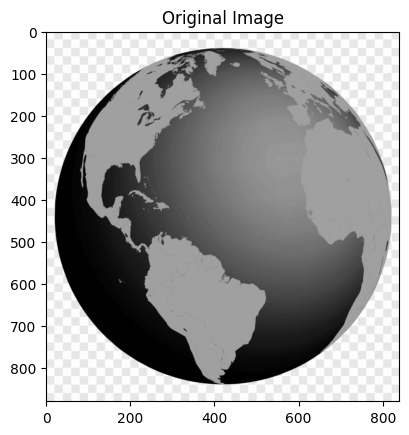

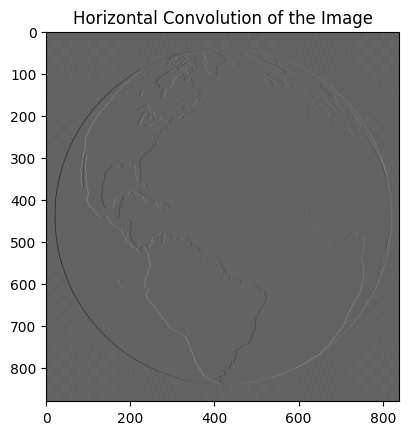

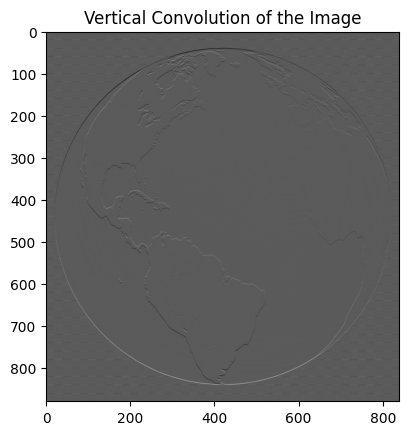

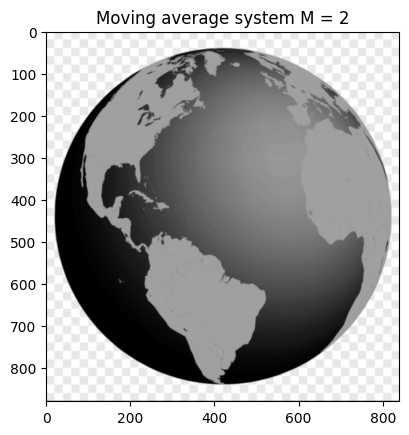

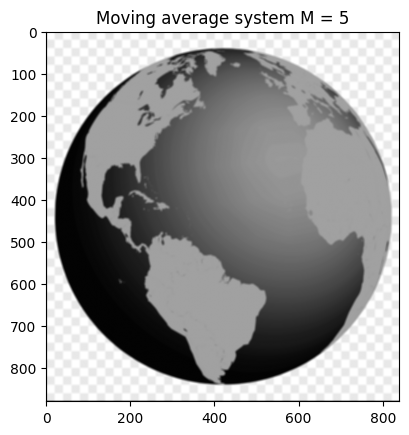

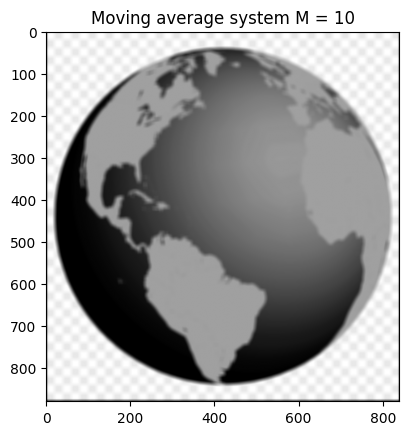

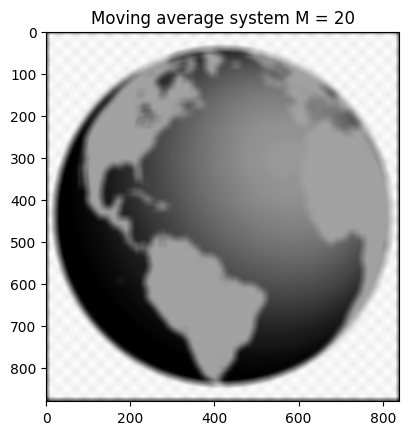

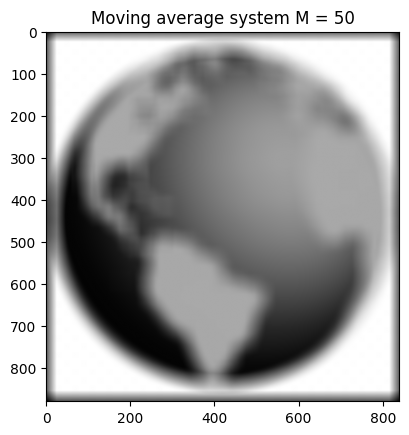

Playing Original Audio Signal


Playing Convolved Audio Signal M = 10


Playing Convolved Audio Signal M = 100


Playing Convolved Audio Signal M = 1000


Playing Convolved Audio Signal M = 10000


Playing Convolved Audio Signal Backward Difference


Playing Difference Audio Signal of Original and Backward Difference


Playing Difference Audio Signal of Original and Moving Average M = 100


In [ ]:
######################################
#(a)
######################################
import matplotlib.image as mpimg
from scipy.signal import convolve2d
img = mpimg.imread("/content/drive/MyDrive/SP-PA2/globe.jpg")

plt.imshow(img[:,:,0],cmap="gray")
plt.title("Original Image")
plt.show()

h_bdiff_h = np.array([[1, -1]])
h_bdiff_v = np.array([[1], [-1]])

y_horizontal = convolve2d(img[:,:,0], h_bdiff_h, mode='same', boundary='fill')
plt.imshow(y_horizontal,cmap="gray")
plt.title("Horizontal Convolution of the Image")
plt.show()

y_vertical = convolve2d(img[:,:,0], h_bdiff_v, mode='same', boundary='fill')
plt.imshow(y_vertical,cmap="gray")
plt.title("Vertical Convolution of the Image")
plt.show()
#iii
M_values = [2, 5, 10, 20, 50]

for M in M_values:
  h_ma = np.ones((M+1, M+1)) / ((M+1)*(M+1))
  y_ma = convolve2d(img[:,:,0], h_ma, mode='same', boundary='fill')
  plt.imshow(y_ma,cmap="gray")
  plt.title(f"Moving average system M = {M}")
  plt.show()

######################################
#(b)
######################################
import soundfile as sf
from IPython.display import Audio, display

data, fs = sf.read("/content/drive/MyDrive/SP-PA2/music.wav")
#standard audio format for Ipython
if data.dtype != np.float32: #correct format
    data = data.astype(np.float32)
if np.max(np.abs(data)) > 1 :#normalise between [-1,1]
    data = data / np.max(np.abs(data))
if data.ndim > 1:  #if audio has 1 or more tracks select first one
  data = data[:, 0]

print("Playing Original Audio Signal")
display(Audio(data, rate=fs))

M = 10
h_ma1 = np.ones(M + 1) / (M + 1)
y_ma1 = np.convolve(data, h_ma1,mode='same')
print("Playing Convolved Audio Signal M = 10")
display(Audio(y_ma1, rate=fs))

M = 100
h_ma2 = np.ones(M + 1) / (M + 1)
y_ma2 = np.convolve(data, h_ma2,mode='same')
print("Playing Convolved Audio Signal M = 100")
display(Audio(y_ma2, rate=fs))

M = 1000
h_ma3 = np.ones(M + 1) / (M + 1)
y_ma3 = np.convolve(data, h_ma3, mode='same')
print("Playing Convolved Audio Signal M = 1000")
display(Audio(y_ma3, rate=fs))

M = 10000
h_ma4 = np.ones(M + 1) / (M + 1)
y_ma4 = np.convolve(data, h_ma4)
print("Playing Convolved Audio Signal M = 10000")
display(Audio(y_ma4, rate=fs))

h_bd = np.array([1, -1])
y_bd = np.convolve(data, h_bd, mode='same')
print("Playing Convolved Audio Signal Backward Difference")
display(Audio(y_bd, rate=fs))

print("Playing Difference Audio Signal of Original and Backward Difference")
diff_back = data - y_bd
display(Audio(diff_back, rate=fs))

print("Playing Difference Audio Signal of Original and Moving Average M = 100")
diff_ma2 = data - y_ma2
display(Audio(diff_ma2, rate=fs))



<h4> <b> Report your observations : </b>  

For Audio Signal
<dt> <h4> i. On doing moving average analysis, we can observe that the high frequecy components are attentuated, acts like a low pass filter. The output audio becomes smoother. On increasing the value of M the beep noise is reduced and some instrument noises are not audible. When M = 10000 it results in echo noise and muffled sound signal, only the low freqeucny components are clearly audible.
</h4> </dt>
<dt> <h4> ii. On doing backward difference analysis, we can observe that the clarity of the sound has increased. It highlights rapid changes and spikes giving an edge enhanced audio. Making sudden variations sound sharper.
 </h4> </dt>

For Image Signal
<dt> <h4> i. Horizontal Convolution highlights the vertical edges of the image. The background region apprears grey while the edges appear bright. Vertical convolution highlights the horizontal edges of the image. Flat regions are not visible, changes along the edges are highlighted (edge detection)
</h4> </dt>
<dt> <h4> ii. Acts as a image smoothing filer, as the value of M increase the image seems more blurred, fine deatils of the image are not visible. But the overall structure is still visible. For lower values of M the image resembles the original one with minor blur.
 </h4> </dt>







<b> **Part (5) : Sampling Theorem** </b>


Let us start by thinking about the sampling process in the time domain as shown in Fig. 5.1. It may be interpreted as the multiplication between a continuous-time domain signal $x(t)$ and a train of impulses $s(t)$.

<!-- <img src="19N5BlvLxNMagGtU2WLY7XyZiY7akUNmA" alt="drawing" width="900"/> -->
![picture](https://drive.google.com/uc?export=view&id=1okw7-ds9yhtoOpSZnMgLNIJb5xazEE9I)
<center>Figure 5.1: The sampling process of an continuous-time signal</center>

Observe that $x_s(t) = x(t)\times s(t) = \sum_n x(nT)\delta(t-nT),$ where $-\infty < n < \infty$ and $T=1/f_s$. This is still a continuous-time signal (variable $t$) which are zero-valued for $t \neq nT$ and should not be confused with the discrete-time signal $x[n]$, which comprises the signal amplitudes at the sampling instances and only exists for $n=0,1,2,\cdots$.

Now think about $x(t)$ and $s(t)$ and their frequency domain representations which are shown in Fig. 5.2.

![picture](https://drive.google.com/uc?export=view&id=1S_oqLQl0pelyjGvxoxNyR_DJ6p-g2JmA)
<center>Figure 5
.2: Frequency domain representation of $x(t)$ and $s(t)$</center>


You may recall that multiplication in the time domain is equivalent to convolution in the frequency domain. Therefore, the dual of $x_s(t) =x(t) \times s(t)$ in the time domain is $X_s(j\omega) = X(j\omega) * S(j\omega)$ in the frequency domain, where '$*$' denotes the linear convolution.

Thus, $X_s(j\omega)$ is a periodic function of frequency $\omega$, consisting of the sum of shifted and scaled replicas of $X(j\omega)$, shifted by integer multiples of $\omega_s$ and scaled by $\frac{1}{T}$.


![picture](https://drive.google.com/uc?export=view&id=1m5ZX2b0SRTMDcdouKsR9voNOf-V4Ujyt)
<center>Figure 5.3: A sampled sine wave and its spectrum</center>

### Sampling Theorem

Sampling, therefore, has the effect of creating spectral images at each and every integer multiple of $\omega_s$. Thus, to avoid corruption of information arising from overlapping spectral images (this distortion is called aliasing), the following condition must be met

---
**Definition**:
$$|\omega_m|  < \frac{\omega_s}{2} \: \text{(Nyquist frequency)}, \quad \text{where } \omega_s  =2\pi f_s =2\pi/T_s \quad \implies \quad |\Omega|  < \pi $$

---

The frequency $\omega_s/2$ is called the Nyquist frequency. If $\omega_m$ is the highest frequency component in the signal, then sampling at a rate (frequency) above twice the maximum signal frequency, $\omega_s>|2\omega_m|$, is called *oversampling*. Sampling at a rate below twice this signal frequency, $\omega_s<|2\omega_m|$, is called *undersampling*. Lastly, sampling at a rate exactly twice this maximum signal frequency, $\omega_s=|2\omega_m|$, is called *critical sampling*.

To see aliasing in action, let us generate some more plots using `sinegen` function by setting $N=100$, $f_s=8000$ Hz and varying:

$(\text{i}) \:  f=150$ Hz, $\quad  (\text{ii}) \: f=300$ Hz, $\quad (\text{iii}) \: f=600$ Hz

$(\text{iv}) \:  f=7400$ Hz, $\quad (\text{v}) \:  f=7700$ Hz $\:$ and $\: (\text{vi}) \:  f=7850$ Hz

In [ ]:
import os

# Create the directory if it doesn't exist
if not os.path.exists('ouputs'):
    os.makedirs('outputs')

FileExistsError: [Errno 17] File exists: 'outputs'

In [ ]:
import scipy.io
import numpy as np
import functools
import matplotlib.pyplot as plt
from scipy.signal import find_peaks


def sinegen(fs, fsig, Nsamp):
    tsamp = 1/fs
    t = np.arange(0, Nsamp*tsamp, tsamp)
    y = np.sin(2*np.pi*fsig*t)
    return t, y


def cosgen(fs, fsig, Nsamp):
    tsamp = 1/fs
    t = np.arange(0, Nsamp*tsamp, tsamp)
    y = np.cos(2*np.pi*fsig*t)
    return t, y

def plot_signal(*args, title='', xlabel='', ylabel='', func='plot', **kwargs):
    fig, ax = plt.subplots()

    eval('ax.'+func+'(*args, **kwargs)')

    ax.set(xlabel=xlabel, ylabel=ylabel, title=title)
    ax.grid()

    plt.tight_layout()
    return plt


**Question 5.1** Describe and discuss the results for (i)-(iii) and (iv)-(vi).

**5.1 Solution ** : (a) For frequencie (i)-(iii)
<dt> <h4> The Sampling Frequecny here **fs = 8000Hz**, the nyquist frequecny is **fs/2 = 4000Hz **. The frequencies (i) 150 Hz, (ii) 300 Hz, and (iii) 600 Hz all lie well below the nyquist frequency limit. Hence, sampling occurs
correctly and **no aliasing occurs** in these cases. The output waveforms resemble the original sinusoidal signal and are periodic. An example of perfect sampling.
</h4> </dt>

Plots for freqeuncies (i)-(iii)

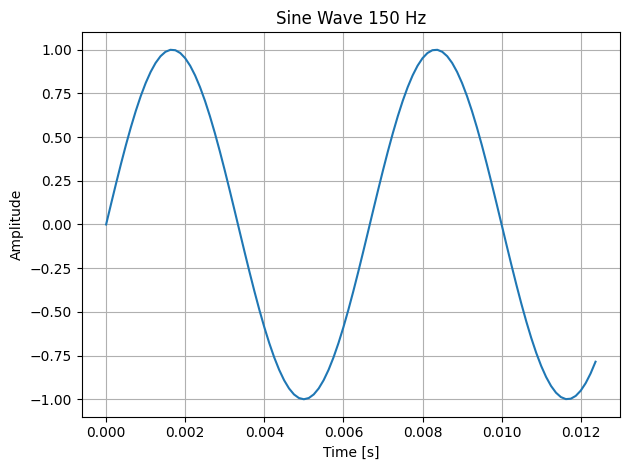

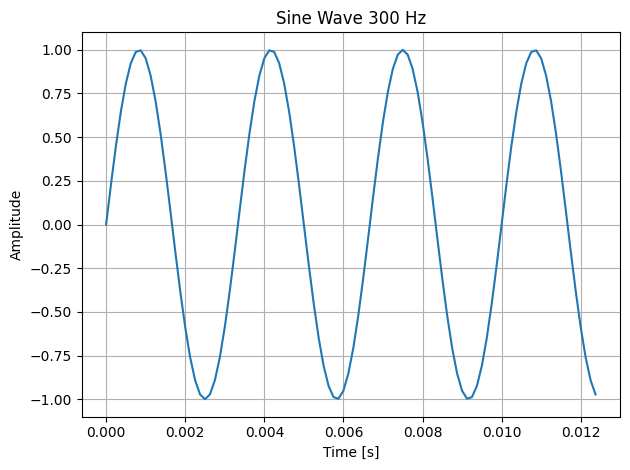

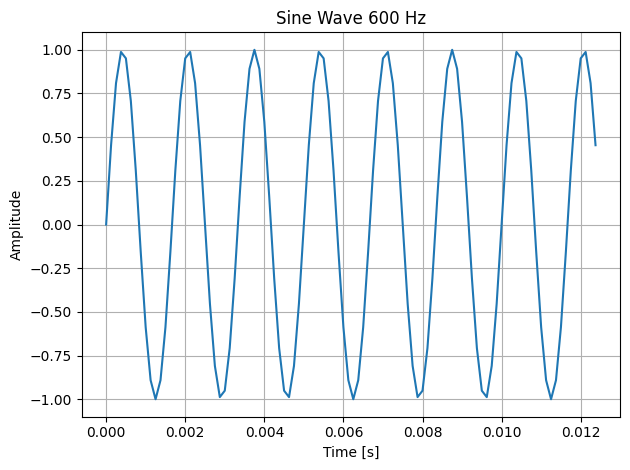

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs = 8000
Nsamp = 100
frequencies = [150, 300, 600]

for fsig in frequencies:
    t, x = sinegen(fs, fsig, Nsamp)  # assuming sinegen is already defined
    plt = plot_signal(t, x,
                      title=f"Sine Wave {fsig} Hz",
                      xlabel="Time [s]",
                      ylabel="Amplitude")
    plt.savefig(f"outputs/sine_{fsig}_hz.pdf")
    plt.show()

**5.1 Solution** : (b) For frequencie (iv)-(vi)
<dt> <h4> The Sampling Frequecny **fs = 8000Hz**, the nyquist frequecny is **fs/2 = 4000Hz **. The signals with frequencies (iv) 7400 Hz, (v) 7700 Hz, and (vi) 7850 Hz. The frequencies in this case are much greater than the nyquist limit 4000Hz, so they violate the nyquist sampling theorem. Aliasing occus in this case while sampling they fold back into a lower range below 4000Hz  

*   7400Hz - 8000-7400 = 600Hz
*   7700Hz - 8000-7700 = 300Hz
*   7850Hz - 8000-7850 = 150Hz

they fold back to the following frequencies. Even though we input sinusoidal signal with frequencies (iv) 7400 Hz, (v) 7700 Hz, and (vi) 7850 Hz. The output waveform shows 600Hz, 300Hz, 150Hz respectively, which dont match with the original input signal. This demonstrates Aliasing phenomenon while sampling.

</h4> </dt>

Plots for Frequecnies (iv)-(vi)

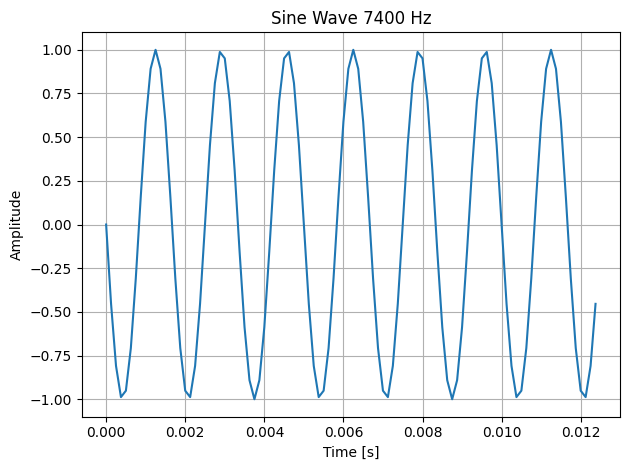

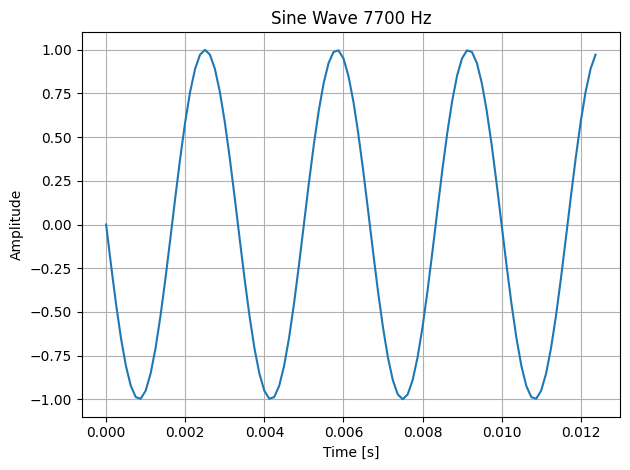

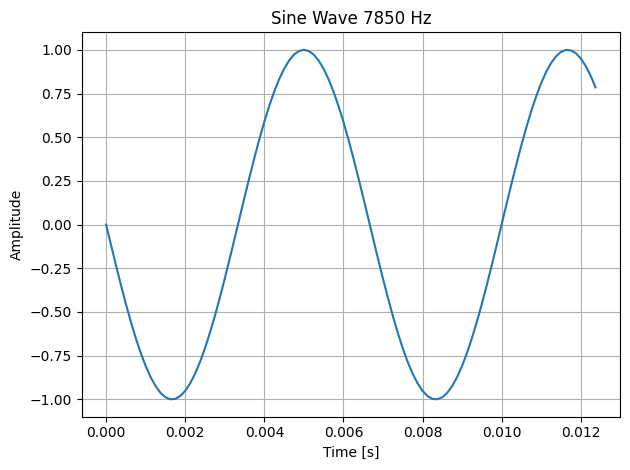

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs = 8000
Nsamp = 100
frequencies = [7400, 7700, 7850]

for fsig in frequencies:
    t, x = sinegen(fs, fsig, Nsamp)  # assuming sinegen is already defined
    plt = plot_signal(t, x,
                      title=f"Sine Wave {fsig} Hz",
                      xlabel="Time [s]",
                      ylabel="Amplitude")
    plt.savefig(f"outputs/sine_{fsig}_hz.pdf")
    plt.show()

**Question 5.2** Predict the results for frequencies $f=24150$ Hz, $\: f=24300$ Hz and $\: f=24600$ Hz and confirm your prediction with Python.

**5.2 Solution** : Predicting the results for frequecnies 24150Hz, 24300Hz and 24600Hz. The aliasing effect is periodic with period $f_s$.

$f_{alias} = \left( |f_{in} - k f_s| \right)$

*   For f = 24150Hz

 $f_{alias} = \left( |24150 - 3 (8000)| \right)$ = 150Hz

*   For f = 24300Hz

$f_{alias} = \left( |24300 - 3 (8000)| \right)$ = 300Hz

*   For f = 24600Hz

$f_{alias} = \left( |24600 - 3 (8000)| \right)$ = 600Hz

Aliasing happens in this case and the signals fold back to fall within the nyquist limit.

The sampled signals with fs = 8000Hz will appear as sinusoids with frequecnies 150Hz, 300Hz and 600Hz.

The output waveforms will look similar as in 5.1 part (a) with frequencies 150, 300 and 600Hz



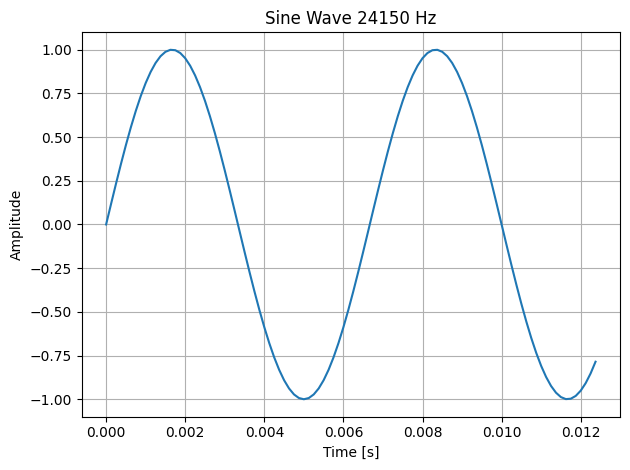

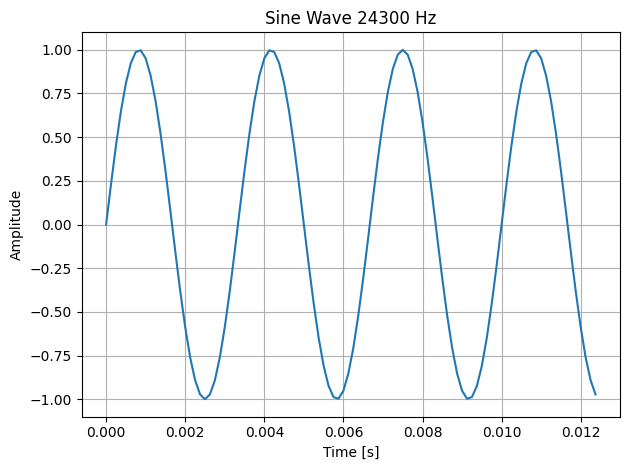

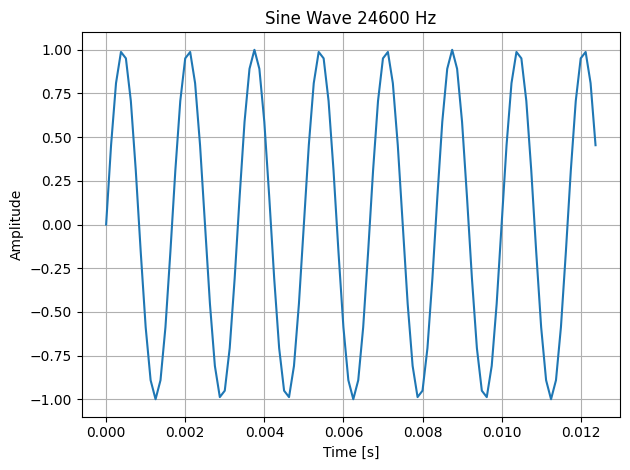

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

fs = 8000
Nsamp = 100
frequencies = [24150, 24300, 24600]

for fsig in frequencies:
    t, x = sinegen(fs, fsig, Nsamp)  # assuming sinegen is already defined
    plt = plot_signal(t, x,
                      title=f"Sine Wave {fsig} Hz",
                      xlabel="Time [s]",
                      ylabel="Amplitude")
    plt.savefig(f"outputs/sine_{fsig}_hz.pdf")
    plt.show()

**Question 5.3** Consider $x(t)=\cos(100\pi t)$

$\quad$(a) Determine the minimum sampling rate to avoid aliasing

$\quad$(b) Write down an expression for $x[n]$ if a sampling frequency of 200 Hz is used.

$\quad$(c) Write down an expression for $x[n]$ if a sampling frequency of 75 Hz is used.

**5.3 (a) Solution**

The frequency of x(t) is 50Hz. To avoid Aliasing

*   $ fs \geq 2*f_{max} $

$f_{max} = 50Hz$, $f_s$ = 100Hz

The minimum sampling rate to avoid aliasing is 100Hz





**5.3 (b) Solution**

given that $f_s$ = 200Hz, no aliasing occurs. $T_s = \frac{1}{200}$


*   $x[n] = x(n*T_s) = \cos(100\pi \cdot n \cdot \frac{1}{200})$ = $\cos(\frac{n\cdot \pi}{2} )$

The expression for x[n] if the sampling frequency 200Hz is used is


*   $x[n] = \cos(\frac{n\pi}{2} )$





**5.3 (c) Solution**

given that $f_s$ = 75Hz, no aliasing occurs. $T_s = \frac{1}{75}$


*   $x[n] = x(n*T_s) = \cos(100\pi \cdot n \cdot \frac{1}{75})$ = $\cos(\frac{4n\cdot \pi}{3} )$

The expression for x[n] if the sampling frequency 200Hz is used is


*   $x[n] = \cos(\frac{4n\pi}{3} )$

**Question 5.4** If the sampling frequency is 48 kHz, what is the normalised angular frequency of the discrete-time signal corresponding to a sinusoid at 1.2 kHz?

**5.4 Solution**

Given $f_s = 48000Hz$ and f = 1200Hz

The normalised angular frequency is given by

*   $\omega = \frac{2\pi f}{f_s}$

substituting

*   $\omega = \frac{2\pi 1200}{48000}$

*   $\omega = \frac{\pi}{20}$

the normalised angular frequency is $\frac{\pi}{20}$ radians per sample




**Question 5.5** Given a signal with a normalised angular frequency of $\frac{\pi}{4}$, what is its frequency expressed in terms of the sampling frequency, $f_s$?

**5.5 Solution**

given $\omega = \frac{\pi}{4}$

normalised andular frequency is given by

*   $\omega = \frac{2\pi f}{f_s}$

substituting

*   $ \frac{\pi}{4} = \frac{2\pi f}{f_s}$

*   $f_s = 8f$

frequency interms of sampling frequency is given by $f = \frac{f_s}{8}$
